 # Skin Diasese detection test

In [1]:
import tensorflow as tf
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Restrict to first GPU and set memory growth
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

In [2]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"] = "TRUE"
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [3]:
tf.__version__

'2.10.0'

## Processing the training set

## Preprocessing the test set

In [4]:

# Common parameters
BATCH_SIZE   = 32
IMG_SIZE     = (128, 128)
DATA_DIR     = r"C:/Users/Uma Banik/OneDrive/Documents/7th sem/cse299/Skin-disease-dataset/main_dataset/train"
SEED         = 42           # keeps split reproducible
VAL_SPLIT    = 0.20         # 80 % train, 20 % validation


datagen = ImageDataGenerator(
    rescale=1./255,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    brightness_range=[0.9, 1.1],
    fill_mode='nearest',
    validation_split=VAL_SPLIT      
)

training_set = datagen.flow_from_directory(
    DATA_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',              # ← **80 % of images**
    shuffle=True,
    seed=SEED
)

test_set = datagen.flow_from_directory(
    DATA_DIR,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',            # ← **20 % of images**
    shuffle=True,
    seed=SEED
)



Found 32904 images belonging to 5 classes.
Found 8224 images belonging to 5 classes.


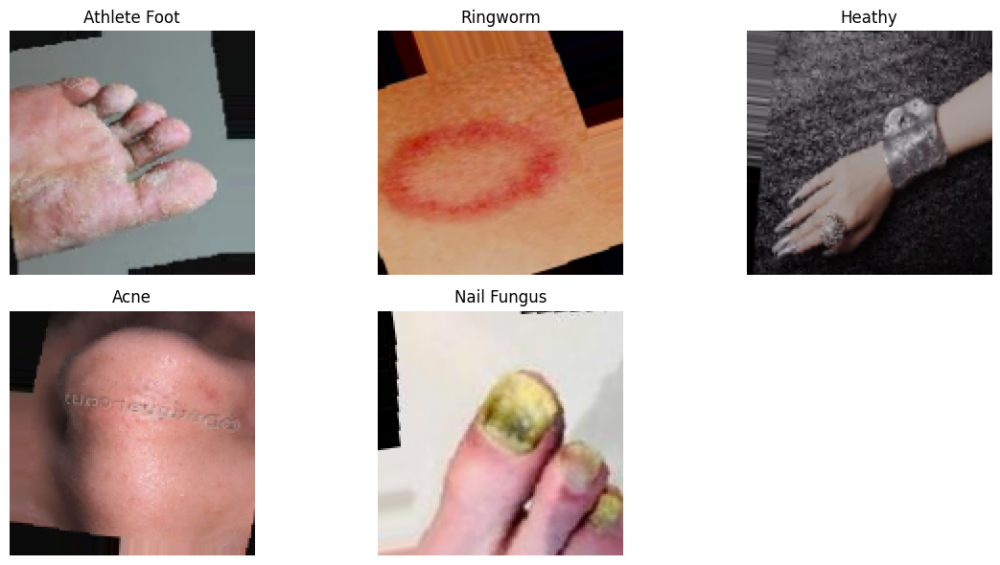

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Load class indices (label → index mapping)
class_indices = training_set.class_indices
index_to_class = {v: k for k, v in class_indices.items()}

# Create a map to store one image per class
seen_classes = set()
images = []
labels = []

# Iterate over batches to collect one image per class
for i in range(len(training_set)):
    x_batch, y_batch = training_set[i]
    for img, label in zip(x_batch, y_batch):
        class_index = np.argmax(label)
        if class_index not in seen_classes:
            seen_classes.add(class_index)
            images.append(img)
            labels.append(index_to_class[class_index])
        if len(seen_classes) == len(index_to_class):
            break
    if len(seen_classes) == len(index_to_class):
        break

# Plot the collected images
plt.figure(figsize=(12, 6))
for i in range(len(images)):
    plt.subplot(2, (len(images) + 1) // 2, i + 1)
    plt.imshow(images[i])
    plt.title(labels[i])
    plt.axis("off")
plt.tight_layout()
plt.show()


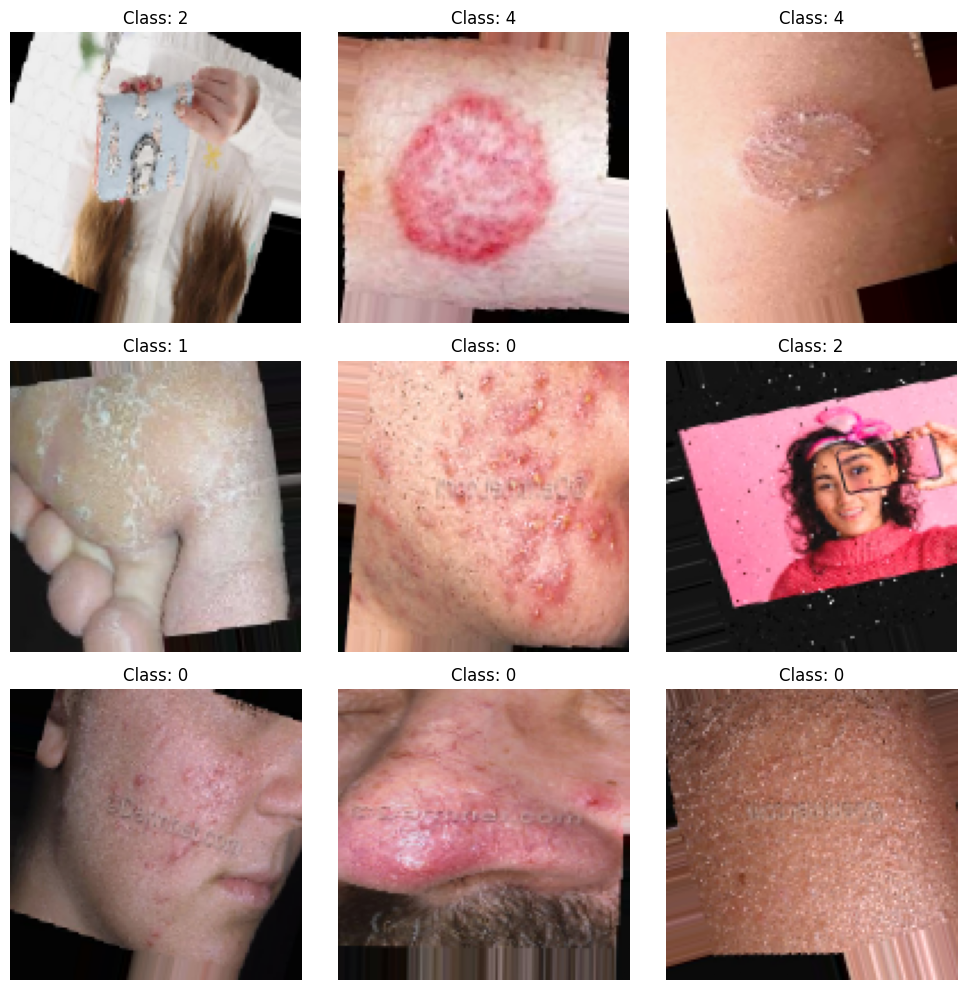

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Get one batch from the training set
images, labels = next(training_set)

# Show 9 augmented images
plt.figure(figsize=(10, 10))
for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.title(f"Class: {np.argmax(labels[i])}")
    plt.axis("off")
plt.tight_layout()
plt.show()


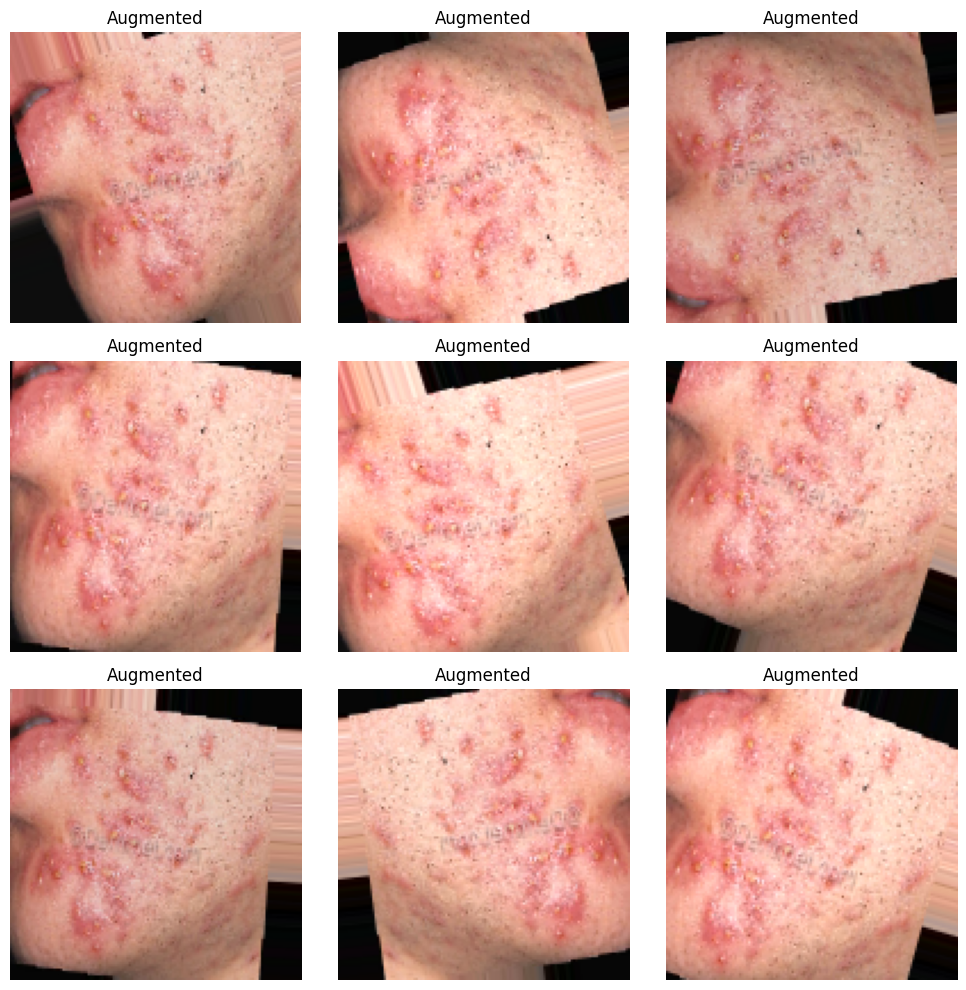

In [7]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing import image

# Load a single image path
img_path = training_set.filepaths[0]
img = image.load_img(img_path, target_size=IMG_SIZE)
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)

# Show multiple augmented versions
plt.figure(figsize=(10, 10))
for i in range(9):
    augmented = datagen.flow(x, batch_size=1)
    aug_img = next(augmented)[0]  # single image in batch
    plt.subplot(3, 3, i + 1)
    plt.imshow(aug_img)
    plt.title("Augmented")
    plt.axis("off")
plt.tight_layout()
plt.show()

## Building the CNN

In [8]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.callbacks import ModelCheckpoint


# Load Pretrained MobileNetV2 (Exclude top layers)
base_model = MobileNetV2(input_shape=(128, 128, 3),
                         include_top=False,
                         weights='imagenet')
base_model.trainable = True
for layer in base_model.layers[:-40]: 
    layer.trainable = False



# Add Custom Classification Head
model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(256, activation='relu'),
    Dropout(0.3),
    Dense(5, activation='softmax')
])


# Train Model
callbacks = [
    EarlyStopping(monitor='val_accuracy', mode='max', patience=10, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7),
    ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True)
]

# Stage 1
base_model.trainable = False
model.compile(optimizer=Adam(1e-3), loss='categorical_crossentropy', metrics=['accuracy'])
history1 = model.fit(training_set, validation_data=test_set, epochs=10, callbacks=callbacks)

# Stage 2
base_model.trainable = True
model.compile(optimizer=Adam(1e-5), loss='categorical_crossentropy', metrics=['accuracy'])
history2 = model.fit(training_set, validation_data=test_set, epochs=20, callbacks=callbacks)



Epoch 1/10
1029/1029 [==============================] - 267s 249ms/step - loss: 0.2117 - accuracy: 0.9292 - val_loss: 0.0806 - val_accuracy: 0.9729 - lr: 0.0010
Epoch 2/10
1029/1029 [==============================] - 230s 224ms/step - loss: 0.1085 - accuracy: 0.9646 - val_loss: 0.0701 - val_accuracy: 0.9756 - lr: 0.0010
Epoch 3/10
1029/1029 [==============================] - 273s 266ms/step - loss: 0.0957 - accuracy: 0.9690 - val_loss: 0.0509 - val_accuracy: 0.9848 - lr: 0.0010
Epoch 4/10
1029/1029 [==============================] - 192s 186ms/step - loss: 0.0788 - accuracy: 0.9752 - val_loss: 0.0456 - val_accuracy: 0.9850 - lr: 0.0010
Epoch 5/10
1029/1029 [==============================] - 167s 162ms/step - loss: 0.0709 - accuracy: 0.9772 - val_loss: 0.0734 - val_accuracy: 0.9802 - lr: 0.0010
Epoch 6/10
1029/1029 [==============================] - 185s 180ms/step - loss: 0.0675 - accuracy: 0.9782 - val_loss: 0.0661 - val_accuracy: 0.9825 - lr: 0.0010
Epoch 7/10
1029/1029 [============

In [9]:
# Training progress
# Combine history from both stages
import pandas as pd

combined_history = {}
for key in history1.history:
    combined_history[key] = history1.history[key] + history2.history[key]



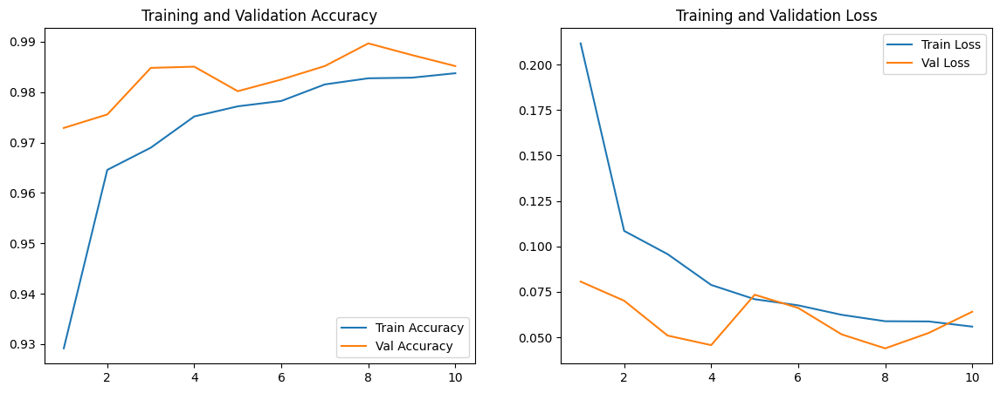

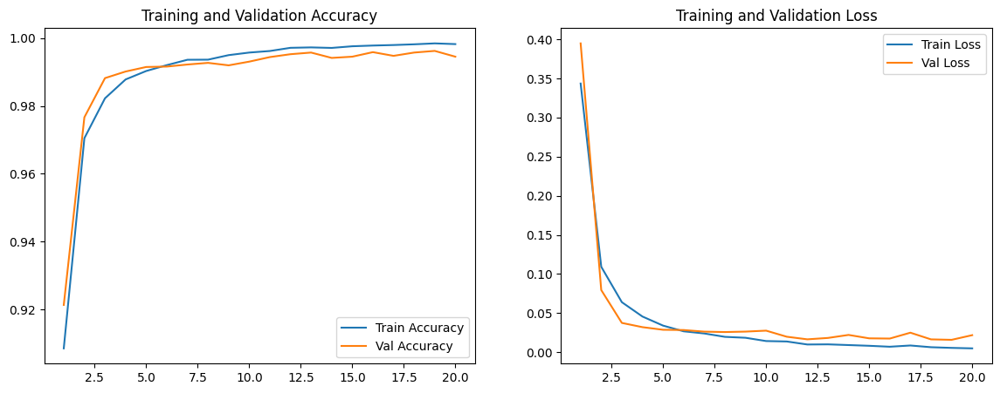

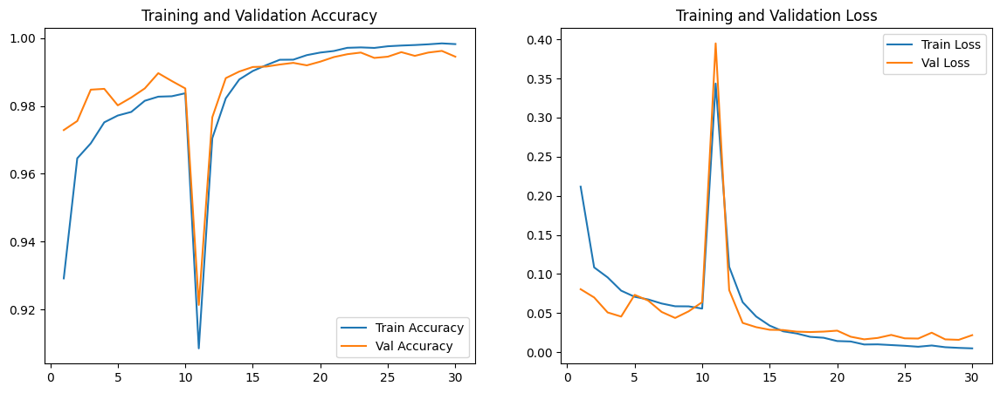

In [10]:
# Training progress
import matplotlib.pyplot as plt

def plot_history(history_dict):
    acc = history_dict['accuracy']
    val_acc = history_dict['val_accuracy']
    loss = history_dict['loss']
    val_loss = history_dict['val_loss']
    epochs_range = range(1, len(acc) + 1)

    plt.figure(figsize=(14, 5))

    # Accuracy Plot
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Train Accuracy')
    plt.plot(epochs_range, val_acc, label='Val Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    # Loss Plot
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Train Loss')
    plt.plot(epochs_range, val_loss, label='Val Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')

    plt.show()

# Use for single stage:
plot_history(history1.history)
plot_history(history2.history)

# Or for combined:
plot_history(combined_history)


1/1 [==============================] - 0s 26ms/step


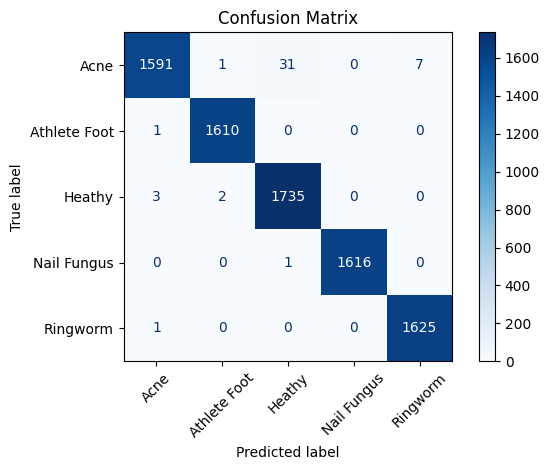

In [11]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# 1. Get true labels and predictions
Y_true = []
Y_pred = []

# Go through test batches and collect predictions
for i in range(len(test_set)):
    x_batch, y_batch = test_set[i]
    y_pred_batch = model.predict(x_batch)
    
    Y_true.extend(np.argmax(y_batch, axis=1))
    Y_pred.extend(np.argmax(y_pred_batch, axis=1))

    if (i + 1) * test_set.batch_size >= test_set.samples:
        break  # Stop if we've processed all test data

# 2. Compute confusion matrix
cm = confusion_matrix(Y_true, Y_pred)
labels = list(test_set.class_indices.keys())  # Class names

# 3. Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap='Blues', xticks_rotation=45)
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()


In [12]:
model.save('299-model-test-v7')

INFO:tensorflow:Assets written to: 299-model-test-v7\assets


INFO:tensorflow:Assets written to: 299-model-test-v7\assets


In [ ]:
model.save('299-model-test-v7.h5')

In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K
import gc

K.clear_session()
gc.collect()

In [5]:
from tensorflow.keras.models import load_model

# Load the model
cnn_model = load_model('299-model-test-v7.h5')

In [18]:


# Method 1: Print the input shape tuple directly
print("Input shape:", cnn_model.input_shape)

# Method 2: Get input tensor shape details
print("Input tensor shape:", cnn_model.inputs[0].shape)


Input shape: (None, 128, 128, 3)
Input tensor shape: (None, 128, 128, 3)


In [16]:

# Print the model summary (includes parameter counts per layer and total)
cnn_model.summary()

# Alternatively, get total number of parameters programmatically:
total_params = cnn_model.count_params()
print(f"Total number of parameters: {total_params}")

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_128 (Funct  (None, 4, 4, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 batch_normalization (BatchN  (None, 1280)             5120      
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 512)               655872    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                        

In [ ]:
import numpy as np
import tensorflow as tf

keras_model = tf.keras.models.load_model('299-model-test-v7.h5')

def representative_data_gen():
    """Generate representative dataset for quantization calibration"""
    for _ in range(100):
        
        sample_input = np.random.rand(1, 128, 128, 3).astype(np.float32)
        yield [sample_input]

# Create the TFLite converter
converter = tf.lite.TFLiteConverter.from_keras_model(keras_model)

converter.optimizations = [tf.lite.Optimize.DEFAULT]

converter.representative_dataset = representative_data_gen

converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]

converter.inference_input_type = tf.int8
converter.inference_output_type = tf.int8

try:
    # Convert the model
    tflite_quant_model = converter.convert()
    
    # Save the converted model
    with open('299-model-test-v7-int8.tflite', 'wb') as f:
        f.write(tflite_quant_model)
    
    print("INT8 quantized TFLite model saved as '299-model-test-v7-int8.tflite'")
    
    # Get model size
    model_size = len(tflite_quant_model)
    print(f"Quantized model size: {model_size / 1024 / 1024:.2f} MB")
    
except Exception as e:
    print(f"Conversion failed: {e}")
    print("Try using float32 inputs/outputs instead of int8")

INFO:tensorflow:Assets written to: C:\Users\UMABAN~1\AppData\Local\Temp\tmpnmgcixhc\assets


INFO:tensorflow:Assets written to: C:\Users\UMABAN~1\AppData\Local\Temp\tmpnmgcixhc\assets
c:\Users\Uma Banik\.conda\envs\gpu\lib\site-packages\tensorflow\lite\python\convert.py:766: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn("Statistics for quantized inputs were expected, but not "


INT8 quantized TFLite model saved as '299-model-test-v7-int8.tflite'
Quantized model size: 3.34 MB


In [6]:
import tensorflow as tf
import numpy as np
import os
import gc
from pathlib import Path
import matplotlib.pyplot as plt

def save_gan_model(gan_model, save_directory="saved_gan_model"):
    
    # Create save directory
    os.makedirs(save_directory, exist_ok=True)
    
    # Save individual components
    generator_path = os.path.join(save_directory, "generator")
    discriminator_path = os.path.join(save_directory, "discriminator")
    feature_extractor_path = os.path.join(save_directory, "feature_extractor")
    
    gan_model.generator.save(generator_path, save_format='tf')
    gan_model.discriminator.save(discriminator_path, save_format='tf')
    gan_model.feature_extractor.save(feature_extractor_path, save_format='tf')
    
    gan_model.generator.save(os.path.join(save_directory, "generator.h5"))
    gan_model.discriminator.save(os.path.join(save_directory, "discriminator.h5"))
    gan_model.feature_extractor.save(os.path.join(save_directory, "feature_extractor.h5"))
    
    # Save model configuration
    config = {
        'latent_dim': gan_model.latent_dim,
        'input_shape': [128, 128, 3],
        'generator_summary': str(gan_model.generator.summary()),
        'discriminator_summary': str(gan_model.discriminator.summary()),
        'feature_extractor_summary': str(gan_model.feature_extractor.summary())
    }
    
    import json
    with open(os.path.join(save_directory, "model_config.json"), 'w') as f:
        json.dump(config, f, indent=2)
    
    print(f"GAN model saved successfully to: {save_directory}")
    print(f"   - Generator: {generator_path}")
    print(f"   - Discriminator: {discriminator_path}")
    print(f"   - Feature Extractor: {feature_extractor_path}")
    
    return save_directory

In [7]:
import tensorflow as tf
import numpy as np
import os
import gc
from pathlib import Path
import matplotlib.pyplot as plt

def load_gan_model(save_directory="saved_gan_model"):
    
    print(f"Loading GAN model from: {save_directory}")
    
    # Load configuration
    import json
    config_path = os.path.join(save_directory, "model_config.json")
    with open(config_path, 'r') as f:
        config = json.load(f)
    
    # GAN model instance
    from your_gan_code import MemoryEfficientGAN  
    loaded_gan = MemoryEfficientGAN(latent_dim=config['latent_dim'])
    
    generator_path = os.path.join(save_directory, "generator")
    discriminator_path = os.path.join(save_directory, "discriminator")
    feature_extractor_path = os.path.join(save_directory, "feature_extractor")
    
    loaded_gan.generator = tf.keras.models.load_model(generator_path)
    loaded_gan.discriminator = tf.keras.models.load_model(discriminator_path)
    loaded_gan.feature_extractor = tf.keras.models.load_model(feature_extractor_path)
    
    print("GAN model loaded successfully!")
    return loaded_gan


In [8]:
import tensorflow as tf
import numpy as np
import os
import gc
from pathlib import Path
import matplotlib.pyplot as plt

def create_representative_dataset(training_set, num_samples=1000):
    
    print(f"Creating representative dataset with {num_samples} samples...")
    
    representative_data = []
    samples_collected = 0
    
    # Reset generator
    training_set.reset()
    
    while samples_collected < num_samples:
        try:
            batch_x, batch_y = next(training_set)
            for img in batch_x:
                if samples_collected >= num_samples:
                    break
                    
                # Normalize to [-1, 1] for GAN (same as training)
                img_normalized = (img * 2.0) - 1.0
                representative_data.append(img_normalized)
                samples_collected += 1
                
                if samples_collected % 200 == 0:
                    print(f"  Collected {samples_collected}/{num_samples} samples...")
                    
        except StopIteration:
            training_set.reset()
            continue
    
    # Convert to numpy array and add batch dimension for single samples
    representative_data = np.array(representative_data, dtype=np.float32)
    print(f" Representative dataset created: {representative_data.shape}")
    
    return representative_data

def convert_gan_to_tflite_int8(gan_model, representative_data, save_directory="tflite_models"):
    
    print(" Converting GAN models to TensorFlow Lite with INT8 quantization...")
    
    os.makedirs(save_directory, exist_ok=True)
    
    converted_models = {}
    
    # Generator conversion
    print("\n Converting Generator...")
    generator_converter = tf.lite.TFLiteConverter.from_keras_model(gan_model.generator)
    generator_converter.optimizations = [tf.lite.Optimize.DEFAULT]
    generator_converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
    generator_converter.inference_input_type = tf.int8
    generator_converter.inference_output_type = tf.int8
    
    # Representative dataset for generator (random noise)
    def generator_representative_dataset():
        for _ in range(100):
            # Create random noise input for generator
            noise = np.random.normal(0, 1, (1, gan_model.latent_dim)).astype(np.float32)
            yield [noise]
    
    generator_converter.representative_dataset = generator_representative_dataset
    
    try:
        generator_tflite = generator_converter.convert()
        generator_path = os.path.join(save_directory, "generator_int8.tflite")
        with open(generator_path, 'wb') as f:
            f.write(generator_tflite)
        converted_models['generator'] = generator_path
        print(f" Generator converted: {generator_path}")
    except Exception as e:
        print(f"Generator conversion failed: {e}")
        converted_models['generator'] = None
    
    # Discriminator conversion
    print("\n Converting Discriminator...")
    discriminator_converter = tf.lite.TFLiteConverter.from_keras_model(gan_model.discriminator)
    discriminator_converter.optimizations = [tf.lite.Optimize.DEFAULT]
    discriminator_converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
    discriminator_converter.inference_input_type = tf.int8
    discriminator_converter.inference_output_type = tf.int8
    
    # Representative dataset for discriminator
    def discriminator_representative_dataset():
        for i in range(min(100, len(representative_data))):
            yield [representative_data[i:i+1]]
    
    discriminator_converter.representative_dataset = discriminator_representative_dataset
    
    try:
        discriminator_tflite = discriminator_converter.convert()
        discriminator_path = os.path.join(save_directory, "discriminator_int8.tflite")
        with open(discriminator_path, 'wb') as f:
            f.write(discriminator_tflite)
        converted_models['discriminator'] = discriminator_path
        print(f" Discriminator converted: {discriminator_path}")
    except Exception as e:
        print(f" Discriminator conversion failed: {e}")
        converted_models['discriminator'] = None
    
    # Feature extractor conversion
    print("\n Converting Feature Extractor...")
    feature_converter = tf.lite.TFLiteConverter.from_keras_model(gan_model.feature_extractor)
    feature_converter.optimizations = [tf.lite.Optimize.DEFAULT]
    feature_converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
    feature_converter.inference_input_type = tf.int8
    feature_converter.inference_output_type = tf.int8
    
    # Representative dataset for feature extractor
    def feature_representative_dataset():
        for i in range(min(100, len(representative_data))):
            yield [representative_data[i:i+1]]
    
    feature_converter.representative_dataset = feature_representative_dataset
    
    try:
        feature_tflite = feature_converter.convert()
        feature_path = os.path.join(save_directory, "feature_extractor_int8.tflite")
        with open(feature_path, 'wb') as f:
            f.write(feature_tflite)
        converted_models['feature_extractor'] = feature_path
        print(f"Feature Extractor converted: {feature_path}")
    except Exception as e:
        print(f"Feature Extractor conversion failed: {e}")
        converted_models['feature_extractor'] = None
    
    print(f"\n TensorFlow Lite conversion completed!")
    print(f"Models saved in: {save_directory}")
    
    return converted_models



In [ ]:
import tensorflow as tf
import numpy as np
import os
import gc
from pathlib import Path
import matplotlib.pyplot as plt

class TFLiteGANPredictor:
    
    def __init__(self, tflite_model_paths, latent_dim=100):
        self.latent_dim = latent_dim
        self.interpreters = {}
        
        # Load TFLite interpreters
        for model_name, model_path in tflite_model_paths.items():
            if model_path and os.path.exists(model_path):
                print(f"Loading {model_name} TFLite model...")
                interpreter = tf.lite.Interpreter(model_path=model_path)
                interpreter.allocate_tensors()
                self.interpreters[model_name] = interpreter
                
                # Get input/output details
                input_details = interpreter.get_input_details()
                output_details = interpreter.get_output_details()
                print(f"  Input shape: {input_details[0]['shape']}")
                print(f"  Input dtype: {input_details[0]['dtype']}")
                print(f"  Output shape: {output_details[0]['shape']}")
                print(f"  Output dtype: {output_details[0]['dtype']}")
            else:
                print(f" {model_name} TFLite model not found: {model_path}")
    
    def predict_discriminator(self, image):
        if 'discriminator' not in self.interpreters:
            raise ValueError("Discriminator TFLite model not loaded")
        
        interpreter = self.interpreters['discriminator']
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()
        
        # Preprocess input
        if image.dtype != input_details[0]['dtype']:
            if input_details[0]['dtype'] == np.int8:
                # Quantize input to int8
                image_quantized = np.round(image * 127).astype(np.int8)
            else:
                image_quantized = image.astype(input_details[0]['dtype'])
        else:
            image_quantized = image
        
        # Set input tensor
        interpreter.set_tensor(input_details[0]['index'], image_quantized)
        
        interpreter.invoke()
    
        output = interpreter.get_tensor(output_details[0]['index'])
        
        if output_details[0]['dtype'] == np.int8:
            output = output.astype(np.float32) / 127.0
        
        return output
    
    def predict_feature_extractor(self, image):
        """Predict using TFLite feature extractor"""
        if 'feature_extractor' not in self.interpreters:
            raise ValueError("Feature extractor TFLite model not loaded")
        
        interpreter = self.interpreters['feature_extractor']
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()
        
        # Preprocess input
        if image.dtype != input_details[0]['dtype']:
            if input_details[0]['dtype'] == np.int8:
                # Quantize input to int8
                image_quantized = np.round(image * 127).astype(np.int8)
            else:
                image_quantized = image.astype(input_details[0]['dtype'])
        else:
            image_quantized = image
        
        # Set input tensor
        interpreter.set_tensor(input_details[0]['index'], image_quantized)
        
        # Run inference
        interpreter.invoke()
        
        # Get output
        output = interpreter.get_tensor(output_details[0]['index'])
        
        # Dequantize if needed
        if output_details[0]['dtype'] == np.int8:
            output = output.astype(np.float32) / 127.0
        
        return output
    
    def generate_image(self, noise=None):
        """Generate image using TFLite generator"""
        if 'generator' not in self.interpreters:
            raise ValueError("Generator TFLite model not loaded")
        
        if noise is None:
            noise = np.random.normal(0, 1, (1, self.latent_dim)).astype(np.float32)
        
        interpreter = self.interpreters['generator']
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()
        
        # Preprocess input
        if noise.dtype != input_details[0]['dtype']:
            if input_details[0]['dtype'] == np.int8:
                # Quantize input to int8
                noise_quantized = np.round(noise * 127).astype(np.int8)
            else:
                noise_quantized = noise.astype(input_details[0]['dtype'])
        else:
            noise_quantized = noise
        
        # Set input tensor
        interpreter.set_tensor(input_details[0]['index'], noise_quantized)
        
        # Run inference
        interpreter.invoke()
        
        # Get output
        output = interpreter.get_tensor(output_details[0]['index'])
        
        # Dequantize if needed
        if output_details[0]['dtype'] == np.int8:
            output = output.astype(np.float32) / 127.0
        
        return output


def complete_gan_conversion_workflow(gan_model, training_set):
    
    # Save the original model
    print("\n Saving original GAN model...")
    save_directory = save_gan_model(gan_model)
    
    # Create representative dataset
    print("\n Creating representative dataset...")
    representative_data = create_representative_dataset(training_set, num_samples=1000)
    
    # Convert to TFLite
    print("\n Converting to TensorFlow Lite...")
    tflite_models = convert_gan_to_tflite_int8(gan_model, representative_data)
    
    # Create TFLite predictor
    print("\n Creating TFLite predictor...")
    tflite_predictor = TFLiteGANPredictor(tflite_models, latent_dim=gan_model.latent_dim)

    
    return {
        'save_directory': save_directory,
        'tflite_models': tflite_models,
        'tflite_predictor': tflite_predictor,
        
    }


In [14]:


import tensorflow as tf
import gc
import os

class MemoryEfficientGAN(tf.keras.Model):
    def __init__(self, latent_dim=100):
        super(MemoryEfficientGAN, self).__init__()
        self.latent_dim = latent_dim
        
        # Build generator
        self.generator = self.build_generator()
        
        # Build discriminator
        self.discriminator = self.build_discriminator()
        
        # Build feature extractor (encoder part)
        self.feature_extractor = self.build_feature_extractor()
        
    def build_generator(self):
        model = tf.keras.Sequential([
            tf.keras.layers.Dense(8*8*256, use_bias=False, input_shape=(self.latent_dim,)),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(),
            tf.keras.layers.Reshape((8, 8, 256)),
            
            tf.keras.layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(),
            
            tf.keras.layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(),
            
            tf.keras.layers.Conv2DTranspose(32, (4, 4), strides=(2, 2), padding='same', use_bias=False),
            tf.keras.layers.BatchNormalization(),
            tf.keras.layers.LeakyReLU(),
            
            tf.keras.layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', use_bias=False, 
                                          activation='tanh')
        ], name="generator")
        
        return model
    
    def build_discriminator(self):
        model = tf.keras.Sequential([
            tf.keras.layers.Conv2D(32, (4, 4), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
            tf.keras.layers.LeakyReLU(),
            tf.keras.layers.Dropout(0.3),
            
            tf.keras.layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same'),
            tf.keras.layers.LeakyReLU(),
            tf.keras.layers.Dropout(0.3),
            
            tf.keras.layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'),
            tf.keras.layers.LeakyReLU(),
            tf.keras.layers.Dropout(0.3),
            
            tf.keras.layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'),
            tf.keras.layers.LeakyReLU(),
            tf.keras.layers.Dropout(0.3),
            
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(1)
        ], name="discriminator")
        
        return model
    
    def build_feature_extractor(self):
        """Build feature extractor for anomaly detection"""
        model = tf.keras.Sequential([
            tf.keras.layers.Conv2D(32, (4, 4), strides=(2, 2), padding='same', input_shape=[128, 128, 3]),
            tf.keras.layers.LeakyReLU(),
            
            tf.keras.layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same'),
            tf.keras.layers.LeakyReLU(),
            
            tf.keras.layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'),
            tf.keras.layers.LeakyReLU(),
            
            tf.keras.layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'),
            tf.keras.layers.LeakyReLU(),
            
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dense(512),
            tf.keras.layers.LeakyReLU(),
        ], name="feature_extractor")
        
        return model

Starting enhanced GAN training with much more data...
This will use approximately 18,000 images per epoch (600 batches × 32 batch_size)
With 30 epochs, total training exposure: ~540,000 image presentations
Initializing GAN for anomaly detection with enhanced data usage...
Training GAN for 30 epochs...
Using approximately 19,200 images per epoch
Total training samples across all epochs: ~576,000
  Epoch 1, Batch 100/600 - Gen: 4.0608, Disc: 0.0587
  Epoch 1, Batch 200/600 - Gen: 2.3578, Disc: 0.7833
  Epoch 1, Batch 300/600 - Gen: 1.2966, Disc: 0.8656
  Epoch 1, Batch 400/600 - Gen: 1.5713, Disc: 0.8098
  Epoch 1, Batch 500/600 - Gen: 1.3283, Disc: 1.1167
  Epoch 1, Batch 600/600 - Gen: 0.9106, Disc: 1.3354
Epoch 1/30 COMPLETED: Gen Loss: 2.1193, Disc Loss: 0.7230
  Epoch 2, Batch 100/600 - Gen: 0.8656, Disc: 1.3074
  Epoch 2, Batch 200/600 - Gen: 0.8716, Disc: 1.2406
  Epoch 2, Batch 300/600 - Gen: 0.9283, Disc: 1.2237
  Epoch 2, Batch 400/600 - Gen: 0.9880, Disc: 1.1538
  Epoch 2, Bat

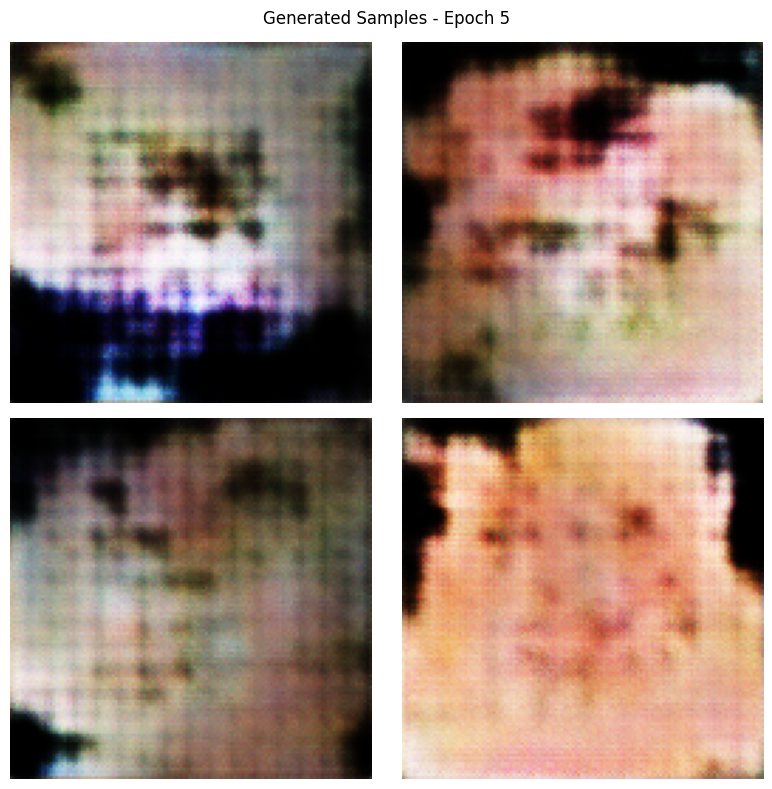

Performing memory cleanup...
  Epoch 6, Batch 100/600 - Gen: 1.1201, Disc: 1.0191
  Epoch 6, Batch 200/600 - Gen: 1.0395, Disc: 1.0772
  Epoch 6, Batch 300/600 - Gen: 1.0119, Disc: 1.0861
  Epoch 6, Batch 400/600 - Gen: 2.1159, Disc: 0.4489
  Epoch 6, Batch 500/600 - Gen: 1.2560, Disc: 1.0332
  Epoch 6, Batch 600/600 - Gen: 1.0782, Disc: 1.0486
Epoch 6/30 COMPLETED: Gen Loss: 1.0924, Disc Loss: 1.0662
  Epoch 7, Batch 100/600 - Gen: 1.0720, Disc: 1.0061
  Epoch 7, Batch 200/600 - Gen: 1.0850, Disc: 1.0834
  Epoch 7, Batch 300/600 - Gen: 1.0905, Disc: 1.0069
  Epoch 7, Batch 400/600 - Gen: 1.1017, Disc: 1.1273
  Epoch 7, Batch 500/600 - Gen: 1.1954, Disc: 0.9314
  Epoch 7, Batch 600/600 - Gen: 1.4168, Disc: 0.8626
Epoch 7/30 COMPLETED: Gen Loss: 1.1871, Disc Loss: 0.9847
  Epoch 8, Batch 100/600 - Gen: 1.3272, Disc: 0.9756
  Epoch 8, Batch 200/600 - Gen: 1.4273, Disc: 0.8094
  Epoch 8, Batch 300/600 - Gen: 1.2522, Disc: 0.8320
  Epoch 8, Batch 400/600 - Gen: 1.3386, Disc: 0.8227
  Epoch

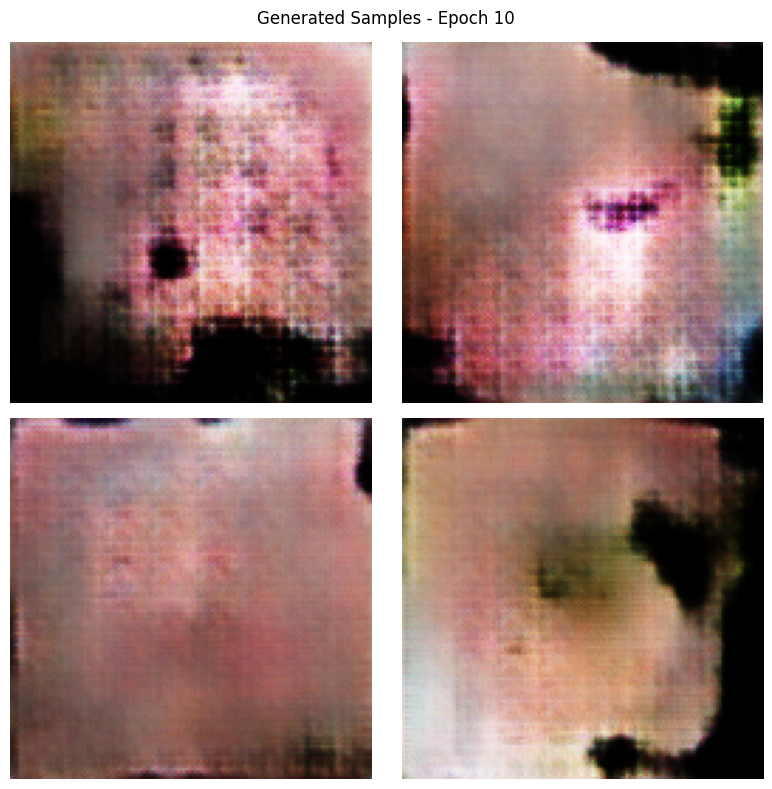

Performing memory cleanup...
  Epoch 11, Batch 100/600 - Gen: 1.8044, Disc: 1.0603
  Epoch 11, Batch 200/600 - Gen: 1.4629, Disc: 0.7899
  Epoch 11, Batch 300/600 - Gen: 1.6431, Disc: 0.7917
  Epoch 11, Batch 400/600 - Gen: 1.6124, Disc: 0.7246
  Epoch 11, Batch 500/600 - Gen: 1.7241, Disc: 0.6653
  Epoch 11, Batch 600/600 - Gen: 1.6554, Disc: 0.6584
Epoch 11/30 COMPLETED: Gen Loss: 1.6200, Disc Loss: 0.7653
  Epoch 12, Batch 100/600 - Gen: 1.6623, Disc: 0.7477
  Epoch 12, Batch 200/600 - Gen: 1.6205, Disc: 0.7722
  Epoch 12, Batch 300/600 - Gen: 1.6552, Disc: 0.7992
  Epoch 12, Batch 400/600 - Gen: 1.4767, Disc: 0.7395
  Epoch 12, Batch 500/600 - Gen: 1.5982, Disc: 0.7224
  Epoch 12, Batch 600/600 - Gen: 1.6604, Disc: 0.6940
Epoch 12/30 COMPLETED: Gen Loss: 1.6332, Disc Loss: 0.7472
  Epoch 13, Batch 100/600 - Gen: 1.7672, Disc: 0.7160
  Epoch 13, Batch 200/600 - Gen: 1.5981, Disc: 0.8283
  Epoch 13, Batch 300/600 - Gen: 1.5279, Disc: 0.8261
  Epoch 13, Batch 400/600 - Gen: 1.6402, Di

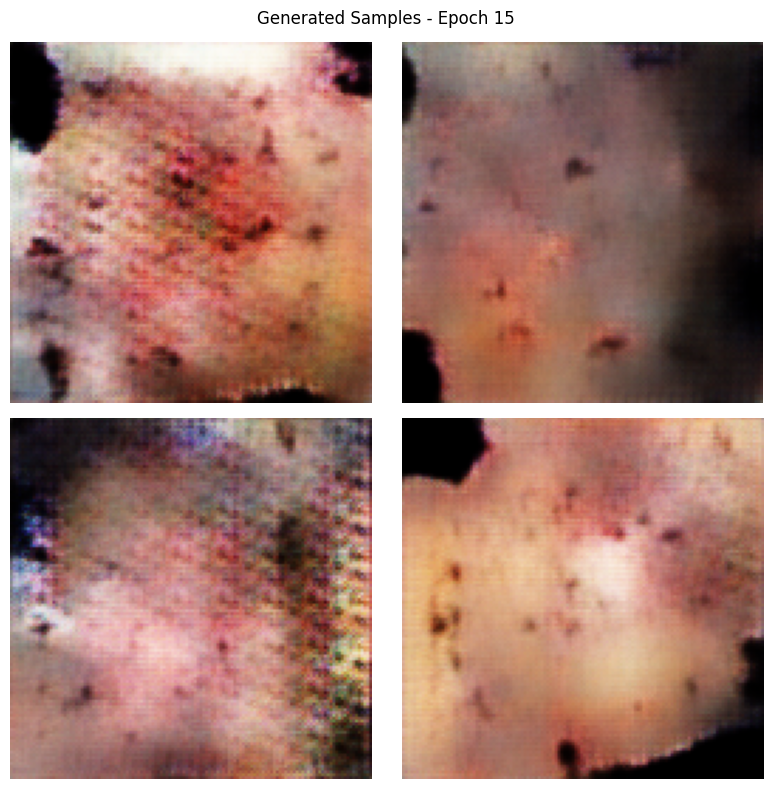

Performing memory cleanup...
  Epoch 16, Batch 100/600 - Gen: 1.5848, Disc: 0.7440
  Epoch 16, Batch 200/600 - Gen: 1.5900, Disc: 0.7520
  Epoch 16, Batch 300/600 - Gen: 1.8617, Disc: 0.7637
  Epoch 16, Batch 400/600 - Gen: 1.5262, Disc: 0.9272
  Epoch 16, Batch 500/600 - Gen: 1.6692, Disc: 0.7358
  Epoch 16, Batch 600/600 - Gen: 1.7837, Disc: 0.6245
Epoch 16/30 COMPLETED: Gen Loss: 1.6653, Disc Loss: 0.7433
  Epoch 17, Batch 100/600 - Gen: 1.7704, Disc: 0.6940
  Epoch 17, Batch 200/600 - Gen: 4.6071, Disc: 2.3685
  Epoch 17, Batch 300/600 - Gen: 2.3433, Disc: 0.4751
  Epoch 17, Batch 400/600 - Gen: 1.8106, Disc: 0.6020
  Epoch 17, Batch 500/600 - Gen: 1.6494, Disc: 0.6840
  Epoch 17, Batch 600/600 - Gen: 1.7088, Disc: 0.7680
Epoch 17/30 COMPLETED: Gen Loss: 1.9200, Disc Loss: 0.7123
  Epoch 18, Batch 100/600 - Gen: 1.6573, Disc: 0.7331
  Epoch 18, Batch 200/600 - Gen: 1.8186, Disc: 0.7403
  Epoch 18, Batch 300/600 - Gen: 1.8194, Disc: 0.7583
  Epoch 18, Batch 400/600 - Gen: 1.6898, Di

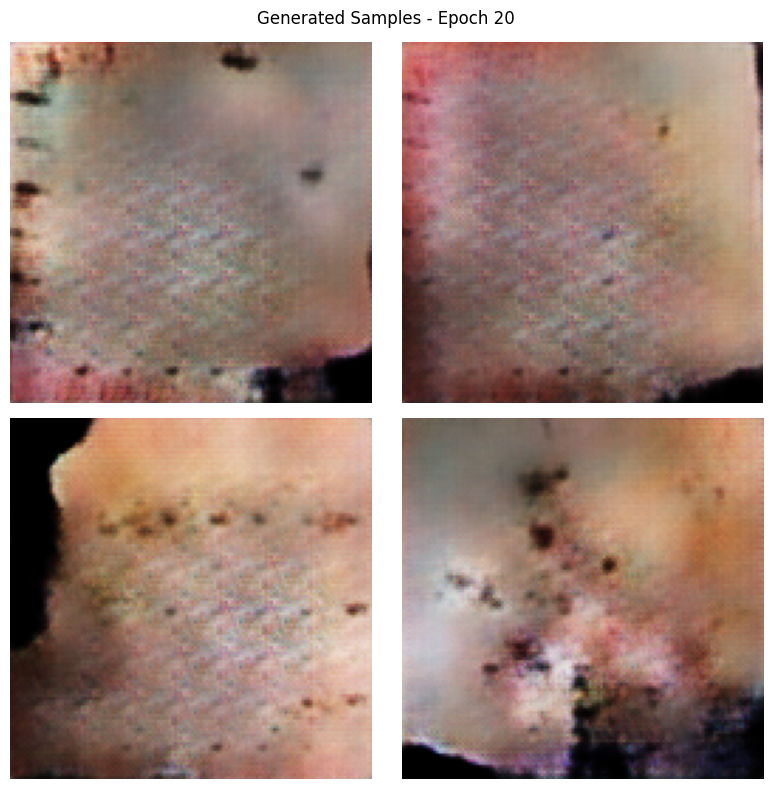

Performing memory cleanup...
  Epoch 21, Batch 100/600 - Gen: 1.8573, Disc: 0.6223
  Epoch 21, Batch 200/600 - Gen: 1.7910, Disc: 0.7087
  Epoch 21, Batch 300/600 - Gen: 1.7885, Disc: 0.6759
  Epoch 21, Batch 400/600 - Gen: 1.6036, Disc: 0.8090
  Epoch 21, Batch 500/600 - Gen: 1.8368, Disc: 0.6716
  Epoch 21, Batch 600/600 - Gen: 1.9053, Disc: 0.6298
Epoch 21/30 COMPLETED: Gen Loss: 1.9535, Disc Loss: 0.6740
  Epoch 22, Batch 100/600 - Gen: 1.8606, Disc: 0.5338
  Epoch 22, Batch 200/600 - Gen: 1.6589, Disc: 0.7314
  Epoch 22, Batch 300/600 - Gen: 1.7533, Disc: 0.6752
  Epoch 22, Batch 400/600 - Gen: 1.7379, Disc: 0.6939
  Epoch 22, Batch 500/600 - Gen: 2.9305, Disc: 0.5683
  Epoch 22, Batch 600/600 - Gen: 2.3677, Disc: 0.8108
Epoch 22/30 COMPLETED: Gen Loss: 1.9624, Disc Loss: 0.7265
  Epoch 23, Batch 100/600 - Gen: 1.8746, Disc: 0.6203
  Epoch 23, Batch 200/600 - Gen: 1.8966, Disc: 0.6284
  Epoch 23, Batch 300/600 - Gen: 1.8025, Disc: 0.6600
  Epoch 23, Batch 400/600 - Gen: 1.6324, Di

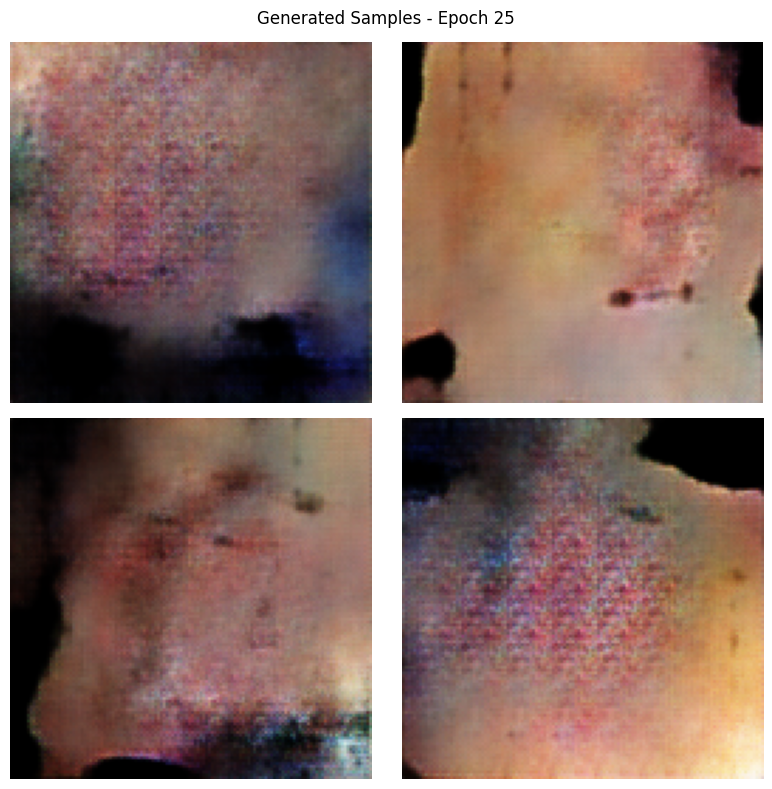

Performing memory cleanup...
  Epoch 26, Batch 100/600 - Gen: 1.5853, Disc: 0.7734
  Epoch 26, Batch 200/600 - Gen: 1.6812, Disc: 0.7332
  Epoch 26, Batch 300/600 - Gen: 1.6063, Disc: 0.7512
  Epoch 26, Batch 400/600 - Gen: 1.6832, Disc: 0.6865
  Epoch 26, Batch 500/600 - Gen: 1.6358, Disc: 0.8441
  Epoch 26, Batch 600/600 - Gen: 1.5825, Disc: 0.7360
Epoch 26/30 COMPLETED: Gen Loss: 1.6354, Disc Loss: 0.7729
  Epoch 27, Batch 100/600 - Gen: 1.8099, Disc: 0.8281
  Epoch 27, Batch 200/600 - Gen: 1.6006, Disc: 0.7715
  Epoch 27, Batch 300/600 - Gen: 1.7054, Disc: 0.7060
  Epoch 27, Batch 400/600 - Gen: 1.9963, Disc: 0.7096
  Epoch 27, Batch 500/600 - Gen: 1.7692, Disc: 0.6886
  Epoch 27, Batch 600/600 - Gen: 1.8134, Disc: 0.6437
Epoch 27/30 COMPLETED: Gen Loss: 1.8281, Disc Loss: 0.7873
  Epoch 28, Batch 100/600 - Gen: 1.6727, Disc: 0.7084
  Epoch 28, Batch 200/600 - Gen: 1.6433, Disc: 0.7080
  Epoch 28, Batch 300/600 - Gen: 1.5416, Disc: 0.8170
  Epoch 28, Batch 400/600 - Gen: 1.6333, Di

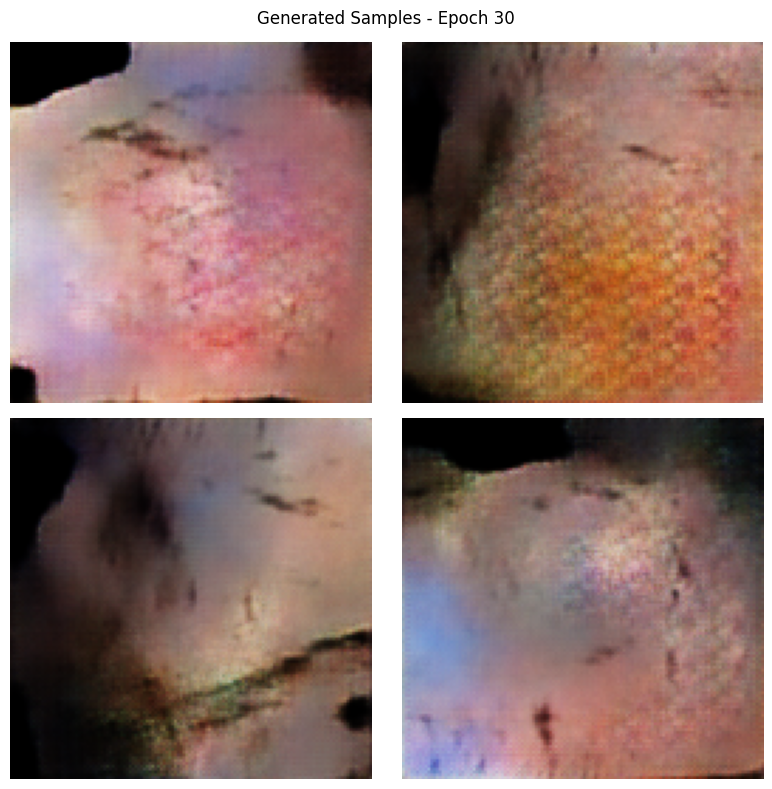

Performing memory cleanup...

✅ Enhanced GAN training completed!
Total batches processed: 18,000
Estimated total images seen: 576,000


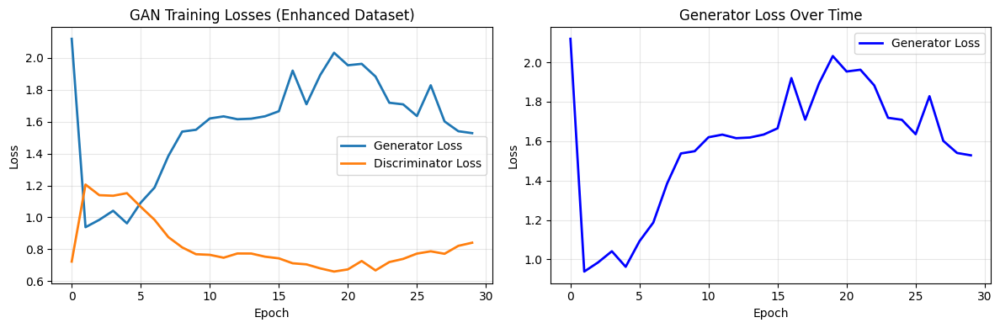

In [8]:
import numpy as np
import tensorflow as tf
import gc
import matplotlib.pyplot as plt
import os

def create_memory_efficient_dataset(data_generator, max_batches_per_epoch=600, shuffle_buffer=1000):
    """Enhanced dataset creation to use more training data with better memory management"""
    
    def data_gen():
        batch_count = 0
        epoch_count = 0
        while True:
            try:
                # Reset generator at start of each epoch to ensure full data coverage
                if batch_count % max_batches_per_epoch == 0:
                    data_generator.reset()
                    epoch_count += 1
                    if epoch_count % 5 == 0:  # Print every 5 epochs
                        print(f"Dataset generator reset for epoch {epoch_count}")
                
                batch_x, batch_y = next(data_generator)
                # Normalize to [-1, 1] for GAN training
                batch_x = (batch_x * 2.0) - 1.0
                
                yield batch_x
                batch_count += 1
                
                # More frequent memory cleanup for larger datasets
                if batch_count % 25 == 0:
                    tf.keras.backend.clear_session() if batch_count % 100 == 0 else None
                    gc.collect()
                    
            except StopIteration:
                data_generator.reset()
                continue
    
    # Create dataset with enhanced memory management
    dataset = tf.data.Dataset.from_generator(
        data_gen,
        output_signature=tf.TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32)
    )
    
    # Add shuffling for better training diversity
    dataset = dataset.shuffle(buffer_size=shuffle_buffer, reshuffle_each_iteration=True)
    
    return dataset.prefetch(tf.data.AUTOTUNE)

# Loss functions
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

def feature_matching_loss(real_features, fake_features):
    return tf.reduce_mean(tf.abs(real_features - fake_features))

# Training step with gradient accumulation for stability
@tf.function
def train_step(images, gan_model, gen_optimizer, disc_optimizer, latent_dim):
    batch_size = tf.shape(images)[0]
    noise = tf.random.normal([batch_size, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = gan_model.generator(noise, training=True)

        real_output = gan_model.discriminator(images, training=True)
        fake_output = gan_model.discriminator(generated_images, training=True)
        
        # Feature matching for better quality
        real_features = gan_model.feature_extractor(images, training=True)
        fake_features = gan_model.feature_extractor(generated_images, training=True)

        gen_loss = generator_loss(fake_output) + 0.1 * feature_matching_loss(real_features, fake_features)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, gan_model.generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, gan_model.discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gradients_of_generator, gan_model.generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(gradients_of_discriminator, gan_model.discriminator.trainable_variables))
    
    return gen_loss, disc_loss

def train_gan(training_set, epochs=30, latent_dim=100, max_batches_per_epoch=600):
    """Train GAN with enhanced memory-efficient approach using much more training data"""
    
    print("Initializing GAN for anomaly detection with enhanced data usage...")
    print("="*70)
    
    # Create GAN model
    gan_model = MemoryEfficientGAN(latent_dim=latent_dim)
    
    # Optimizers with slightly lower learning rates for stability with more data
    generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.999)
    discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.999)
    
    # Create enhanced memory-efficient dataset
    train_dataset = create_memory_efficient_dataset(
        training_set, 
        max_batches_per_epoch=max_batches_per_epoch,
        shuffle_buffer=200  # Smaller shuffle buffer to save memory
    )
    
    # Training metrics
    gen_losses = []
    disc_losses = []
    
    # Calculate approximate images per epoch
    images_per_epoch = max_batches_per_epoch * 32  # Assuming BATCH_SIZE = 32
    print(f"Training GAN for {epochs} epochs...")
    print(f"Using approximately {images_per_epoch:,} images per epoch")
    print(f"Total training samples across all epochs: ~{images_per_epoch * epochs:,}")
    print("="*70)
    
    for epoch in range(epochs):
        epoch_gen_loss = []
        epoch_disc_loss = []
        
        # Enhanced progress tracking
        batch_count = 0
        for image_batch in train_dataset:
            if batch_count >= max_batches_per_epoch:
                break
                
            gen_loss, disc_loss = train_step(
                image_batch, gan_model, generator_optimizer, 
                discriminator_optimizer, latent_dim
            )
            
            epoch_gen_loss.append(gen_loss)
            epoch_disc_loss.append(disc_loss)
            batch_count += 1
            
            # Progress indicator for longer epochs
            if batch_count % 100 == 0:
                current_gen_loss = np.mean(epoch_gen_loss[-10:]) if len(epoch_gen_loss) >= 10 else np.mean(epoch_gen_loss)
                current_disc_loss = np.mean(epoch_disc_loss[-10:]) if len(epoch_disc_loss) >= 10 else np.mean(epoch_disc_loss)
                print(f"  Epoch {epoch+1}, Batch {batch_count}/{max_batches_per_epoch} - Gen: {current_gen_loss:.4f}, Disc: {current_disc_loss:.4f}")
        
        # Calculate average losses
        avg_gen_loss = np.mean(epoch_gen_loss)
        avg_disc_loss = np.mean(epoch_disc_loss)
        
        gen_losses.append(avg_gen_loss)
        disc_losses.append(avg_disc_loss)
        
        # Enhanced progress reporting
        print(f'Epoch {epoch + 1}/{epochs} COMPLETED: Gen Loss: {avg_gen_loss:.4f}, Disc Loss: {avg_disc_loss:.4f}')
        
        # Generate sample images for visual inspection
        if (epoch + 1) % 5 == 0:
            sample_noise = tf.random.normal([4, latent_dim])
            generated_samples = gan_model.generator(sample_noise, training=False)
            
            plt.figure(figsize=(8, 8))
            for i in range(4):
                plt.subplot(2, 2, i + 1)
                # Convert from [-1, 1] to [0, 1] for display
                img = (generated_samples[i] + 1.0) / 2.0
                img = tf.clip_by_value(img, 0.0, 1.0)
                plt.imshow(img)
                plt.axis('off')
            plt.suptitle(f'Generated Samples - Epoch {epoch + 1}')
            plt.tight_layout()
            plt.show()
        
        # Enhanced memory cleanup for longer training
        if (epoch + 1) % 5 == 0:
            print("Performing memory cleanup...")
            tf.keras.backend.clear_session()
            gc.collect()
    
    print("\n✅ Enhanced GAN training completed!")
    print(f"Total batches processed: {epochs * max_batches_per_epoch:,}")
    print(f"Estimated total images seen: {epochs * images_per_epoch:,}")
    
    # Plot training history
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(gen_losses, label='Generator Loss', linewidth=2)
    plt.plot(disc_losses, label='Discriminator Loss', linewidth=2)
    plt.title('GAN Training Losses (Enhanced Dataset)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.subplot(1, 2, 2)
    plt.plot(gen_losses, label='Generator Loss', color='blue', linewidth=2)
    plt.title('Generator Loss Over Time')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    return gan_model, gen_losses, disc_losses

# Train the GAN with enhanced data usage
print("Starting enhanced GAN training with much more data...")
print("This will use approximately 18,000 images per epoch (600 batches × 32 batch_size)")
print("With 30 epochs, total training exposure: ~540,000 image presentations")

gan_model, gen_losses, disc_losses = train_gan(
    training_set, 
    epochs=30,           # Reduced epochs since we're using much more data per epoch
    latent_dim=100,
    max_batches_per_epoch=600  # Using ~19,200 images per epoch (600 * 32)
)



In [11]:
import tensorflow as tf

generator_path = "saved_gan_model/generator"
discriminator_path = "saved_gan_model/discriminator"
feature_extractor_path = "saved_gan_model/feature_extractor"

# Load models
generator = tf.keras.models.load_model(generator_path)
discriminator = tf.keras.models.load_model(discriminator_path)
feature_extractor = tf.keras.models.load_model(feature_extractor_path)


In [12]:
def count_params(model):
    return sum([tf.size(variable).numpy() for variable in model.trainable_variables])

print("Parameters count in loaded models:")
print(f"Generator params: {count_params(generator):,}")
print(f"Discriminator params: {count_params(discriminator):,}")
print(f"Feature Extractor params: {count_params(feature_extractor):,}")

total_params = count_params(generator) + count_params(discriminator) + count_params(feature_extractor)
print(f"Total GAN params: {total_params:,}")


Parameters count in loaded models:
Generator params: 2,361,280
Discriminator params: 706,529
Feature Extractor params: 821,728
Total GAN params: 3,889,537


In [13]:
generator.summary()
discriminator.summary()
feature_extractor.summary()


Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1638400   
                                                                 
 batch_normalization (BatchN  (None, 16384)            65536     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 16, 16, 128)      524288    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 128)      51

In [ ]:
results = complete_gan_conversion_workflow(
    gan_model=gan_model,
    training_set=training_set
)

tflite_predictor = results['tflite_predictor']

In [ ]:
tflite_model_paths = {
    'generator': 'int8 models/generator_int8.tflite',
    'discriminator': 'int8 models/discriminator_int8.tflite',
    'feature_extractor': 'int8 models/feature_extractor_int8.tflite'
}
latent_dim = 100 
predictor = TFLiteGANPredictor(tflite_model_paths, latent_dim=latent_dim)


Loading generator TFLite model...
  Input shape: [  1 100]
  Input dtype: <class 'numpy.int8'>
  Output shape: [  1 128 128   3]
  Output dtype: <class 'numpy.int8'>
Loading discriminator TFLite model...
  Input shape: [  1 128 128   3]
  Input dtype: <class 'numpy.int8'>
  Output shape: [1 1]
  Output dtype: <class 'numpy.int8'>
Loading feature_extractor TFLite model...
  Input shape: [  1 128 128   3]
  Input dtype: <class 'numpy.int8'>
  Output shape: [  1 512]
  Output dtype: <class 'numpy.int8'>


In [ ]:
import tensorflow as tf

def get_tflite_param_count(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    param_count = 0
    
    for detail in interpreter.get_tensor_details():
        shape = detail['shape']
        if len(shape) > 0:  # ignore scalars and non-weight tensors
            count = 1
            for dim in shape:
                count *= dim
            param_count += count
    
    return param_count

# Example usage
model_path = "generator_int8.tflite"
total_params = get_tflite_param_count(model_path)
print(f"Total parameters: {total_params:,}")



Total parameters: 2,951,020


In [2]:
import tensorflow as tf

def get_tflite_param_count(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    param_count = 0
    
    for detail in interpreter.get_tensor_details():
        shape = detail['shape']
        if len(shape) > 0:  # ignore scalars and non-weight tensors
            count = 1
            for dim in shape:
                count *= dim
            param_count += count
    
    return param_count

# Example usage
model_path = "discriminator_int8.tflite"
total_params = get_tflite_param_count(model_path)
print(f"Total parameters: {total_params:,}")



Total parameters: 2,377,700


In [3]:
import tensorflow as tf

def get_tflite_param_count(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    param_count = 0
    
    for detail in interpreter.get_tensor_details():
        shape = detail['shape']
        if len(shape) > 0:  # ignore scalars and non-weight tensors
            count = 1
            for dim in shape:
                count *= dim
            param_count += count
    
    return param_count

# Example usage
model_path = "feature_extractor_int8.tflite"
total_params = get_tflite_param_count(model_path)
print(f"Total parameters: {total_params:,}")



Total parameters: 2,477,544


In [ ]:


def tflite_anomaly_detection(image_path, cnn_model, tflite_predictor, 
                           gan_threshold, cnn_confidence_threshold=0.9):
    
    # Load and preprocess image
    test_image = tf.keras.preprocessing.image.load_img(image_path, target_size=(128, 128))
    test_image_array = tf.keras.preprocessing.image.img_to_array(test_image)
    test_image_array = np.expand_dims(test_image_array, axis=0)
    test_image_normalized = test_image_array / 255.0
    
    # CNN prediction first
    cnn_prediction = cnn_model.predict(test_image_normalized, verbose=0)
    cnn_confidence = np.max(cnn_prediction)
    predicted_class_index = np.argmax(cnn_prediction)
    
    # Get class names
    class_names = list(training_set.class_indices.keys())
    predicted_class = class_names[predicted_class_index]
    
    if cnn_confidence >= cnn_confidence_threshold:
        # High confidence - trust CNN
        return {
            'prediction': predicted_class,
            'is_anomaly': False,
            'cnn_confidence': cnn_confidence,
            'decision_path': 'CNN_HIGH_CONFIDENCE'
        }
    else:
        # Low confidence - use TFLite GAN for anomaly detection
        test_image_gan = (test_image_normalized * 2.0) - 1.0  # Normalize for GAN
        
        # Use TFLite discriminator
        disc_score = tflite_predictor.predict_discriminator(test_image_gan)
        
        if disc_score is not None:
            # Convert discriminator score to anomaly score
            disc_prob = 1.0 / (1.0 + np.exp(-disc_score[0][0]))  # Sigmoid
            anomaly_score = 1.0 - disc_prob  # Invert for anomaly detection
            
            is_anomaly = anomaly_score > gan_threshold
            
            return {
                'prediction': 'ANOMALY' if is_anomaly else predicted_class,
                'is_anomaly': is_anomaly,
                'cnn_confidence': cnn_confidence,
                'anomaly_score': anomaly_score,
                'discriminator_score': disc_prob,
                'decision_path': 'TFLITE_GAN_CHECK'
            }
        else:
            # Fallback if TFLite fails
            return {
                'prediction': 'ANOMALY' if cnn_confidence < 0.7 else predicted_class,
                'is_anomaly': cnn_confidence < 0.7,
                'cnn_confidence': cnn_confidence,
                'decision_path': 'FALLBACK'
            }


In [ ]:
disc_score = tflite_predictor.predict_discriminator(test_image_gan)

In [19]:
# After conversion completes, test it:
result = tflite_anomaly_detection('testing/anomaly2/v12.jpg', cnn_model, tflite_predictor, gan_threshold)
print(f"Prediction: {result['prediction']}")
print(f"Is Anomaly: {result['is_anomaly']}")
print(f"Confidence: {result['cnn_confidence']:.4f}")

Prediction: ANOMALY
Is Anomaly: True
Confidence: 0.7575


Preparing enhanced training data for GAN anomaly detection...
Collected 2000/10000 samples...
Collected 4000/10000 samples...
Collected 6000/10000 samples...
Collected 8000/10000 samples...
Collected 10000/10000 samples...
Calculating GAN-based anomaly scores on training data...

GAN Anomaly Score Thresholds:
30th percentile: 0.079224
35th percentile: 0.107734
40th percentile: 0.142153
45th percentile: 0.180767
50th percentile: 0.222861
55th percentile: 0.269180
60th percentile: 0.308935
65th percentile: 0.346709
70th percentile: 0.383481
75th percentile: 0.413899
80th percentile: 0.440063
85th percentile: 0.460664

Using 0.107734 as GAN anomaly detection threshold


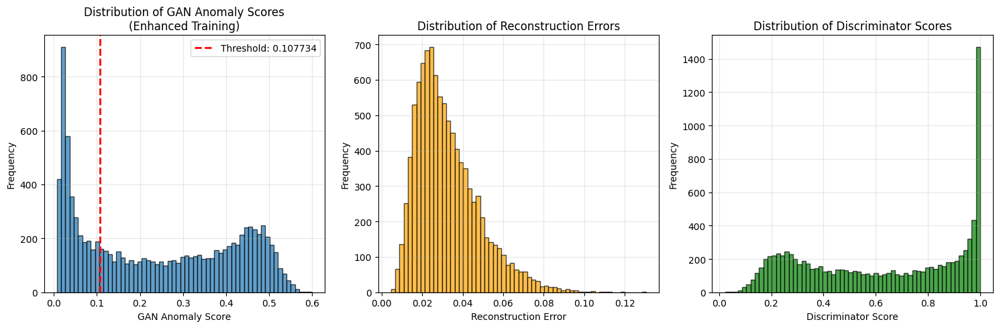


📊 Enhanced GAN Anomaly Score Statistics:
Mean: 0.239124
Std: 0.177408
Min: 0.007066
Max: 0.599774

✅ Enhanced GAN-based anomaly detection setup completed!
🚀 Model trained on ~576,000 image presentations across all epochs


In [ ]:
def calculate_gan_anomaly_scores(gan_model, images, batch_size=8):
    """Calculate anomaly scores using GAN-based approach"""
    
    anomaly_scores = []
    reconstruction_errors = []
    discriminator_scores = []
    
    num_batches = (len(images) + batch_size - 1) // batch_size
    
    for i in range(0, len(images), batch_size):
        batch = images[i:i + batch_size]
        
        # Normalize to [-1, 1] for GAN
        batch_normalized = (batch * 2.0) - 1.0
        
        # Method 1: Discriminator score (how "real" the image looks)
        disc_scores = gan_model.discriminator(batch_normalized, training=False)
        disc_scores = tf.nn.sigmoid(disc_scores).numpy().flatten()
        
        # Method 2: Feature-based reconstruction error
        real_features = gan_model.feature_extractor(batch_normalized, training=False)
        
        # Try to find the best latent representation
        best_reconstruction_errors = []
        
        for img_idx in range(batch.shape[0]):
            single_img = batch_normalized[img_idx:img_idx+1]
            single_real_features = real_features[img_idx:img_idx+1]
            
            # Multiple attempts to find best reconstruction
            best_error = float('inf')
            for attempt in range(5):  # Multiple random attempts
                noise = tf.random.normal([1, gan_model.latent_dim])
                generated_img = gan_model.generator(noise, training=False)
                generated_features = gan_model.feature_extractor(generated_img, training=False)
                
                # Feature-based reconstruction error
                feature_error = tf.reduce_mean(tf.square(single_real_features - generated_features)).numpy()
                
                # Image-based reconstruction error
                img_error = tf.reduce_mean(tf.square(single_img - generated_img)).numpy()
                
                # Combined error
                combined_error = feature_error + 0.1 * img_error
                
                if combined_error < best_error:
                    best_error = combined_error
            
            best_reconstruction_errors.append(best_error)
        
        # Combine discriminator score and reconstruction error
        for j in range(len(disc_scores)):
            # Lower discriminator score = more likely to be anomaly
            # Higher reconstruction error = more likely to be anomaly
            disc_anomaly_score = 1.0 - disc_scores[j]  # Invert discriminator score
            recon_anomaly_score = best_reconstruction_errors[j]
            
            # Weighted combination
            combined_score = 0.6 * disc_anomaly_score + 0.4 * recon_anomaly_score
            
            anomaly_scores.append(combined_score)
            reconstruction_errors.append(best_reconstruction_errors[j])
            discriminator_scores.append(disc_scores[j])
    
    return (np.array(anomaly_scores), 
            np.array(reconstruction_errors), 
            np.array(discriminator_scores))

def prepare_gan_training_data(data_generator, num_samples=10000):
    """Prepare more training data for better threshold calculation"""
    
    images = []
    samples_collected = 0
    
    print(f"Collecting {num_samples} training samples for threshold calculation...")
    
    while samples_collected < num_samples:
        try:
            batch_x, batch_y = next(data_generator)
            for img in batch_x:
                if samples_collected >= num_samples:
                    break
                images.append(img)
                samples_collected += 1
                
                if samples_collected % 2000 == 0:
                    print(f"Collected {samples_collected}/{num_samples} samples...")
                    
        except StopIteration:
            data_generator.reset()
            continue
    
    return np.array(images)

# Prepare more training data for better threshold calculation
print("Preparing enhanced training data for GAN anomaly detection...")
train_images_for_threshold = prepare_gan_training_data(training_set, num_samples=10000)

print("Calculating GAN-based anomaly scores on training data...")
train_anomaly_scores, train_reconstruction_errors, train_disc_scores = calculate_gan_anomaly_scores(
    gan_model, train_images_for_threshold, batch_size=8
)

# Calculate thresholds
threshold_percentiles = [30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85]
print("\nGAN Anomaly Score Thresholds:")
for percentile in threshold_percentiles:
    threshold = np.percentile(train_anomaly_scores, percentile)
    print(f"{percentile}th percentile: {threshold:.6f}")

# Use a conservative threshold for better balance
gan_threshold = np.percentile(train_anomaly_scores, 35)  # More conservative due to better training
print(f"\nUsing {gan_threshold:.6f} as GAN anomaly detection threshold")

# Plot anomaly score distribution
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(train_anomaly_scores, bins=60, alpha=0.7, edgecolor='black')
plt.axvline(gan_threshold, color='red', linestyle='--', linewidth=2,
            label=f'Threshold: {gan_threshold:.6f}')
plt.xlabel('GAN Anomaly Score')
plt.ylabel('Frequency')
plt.title('Distribution of GAN Anomaly Scores\n(Enhanced Training)')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 3, 2)
plt.hist(train_reconstruction_errors, bins=60, alpha=0.7, edgecolor='black', color='orange')
plt.xlabel('Reconstruction Error')
plt.ylabel('Frequency')
plt.title('Distribution of Reconstruction Errors')
plt.grid(True, alpha=0.3)

plt.subplot(1, 3, 3)
plt.hist(train_disc_scores, bins=60, alpha=0.7, edgecolor='black', color='green')
plt.xlabel('Discriminator Score')
plt.ylabel('Frequency')
plt.title('Distribution of Discriminator Scores')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\n Enhanced GAN Anomaly Score Statistics:")
print(f"Mean: {np.mean(train_anomaly_scores):.6f}")
print(f"Std: {np.std(train_anomaly_scores):.6f}")
print(f"Min: {np.min(train_anomaly_scores):.6f}")
print(f"Max: {np.max(train_anomaly_scores):.6f}")

print("\n Enhanced GAN-based anomaly detection setup completed!")
print(f" Model trained on ~{30 * 600 * 32:,} image presentations across all epochs")

In [ ]:

def hybrid_prediction_gan(image_path, cnn_model, gan_model, gan_threshold, 
                         cnn_confidence_threshold=0.9, target_size=(128, 128)):
    """Hybrid prediction using CNN + GAN for anomaly detection"""
    
    # Load and preprocess image
    test_image = tf.keras.preprocessing.image.load_img(image_path, target_size=target_size)
    test_image_array = tf.keras.preprocessing.image.img_to_array(test_image)
    test_image_array = np.expand_dims(test_image_array, axis=0)
    test_image_normalized = test_image_array / 255.0
    
    # CNN Prediction
    cnn_prediction = cnn_model.predict(test_image_normalized, verbose=0)
    predicted_class_index = np.argmax(cnn_prediction)
    cnn_confidence = np.max(cnn_prediction)
    
    # Get class names
    class_names = list(training_set.class_indices.keys())
    predicted_class = class_names[predicted_class_index]
    
    # Decision logic
    if cnn_confidence >= cnn_confidence_threshold:
        is_anomaly = False
        anomaly_score = 0.0
        reconstruction_error = 0.0
        discriminator_score = 1.0
        decision_path = "CNN_HIGH_CONFIDENCE"
        final_prediction = predicted_class
    else:
        # Low confidence CNN prediction - use GAN for anomaly detection
        gan_anomaly_scores, gan_recon_errors, gan_disc_scores = calculate_gan_anomaly_scores(
            gan_model, test_image_normalized, batch_size=1
        )
        
        anomaly_score = gan_anomaly_scores[0]
        reconstruction_error = gan_recon_errors[0]
        discriminator_score = gan_disc_scores[0]
        
        # Enhanced anomaly detection logic
        is_anomaly = (anomaly_score > gan_threshold) or (cnn_confidence < 0.70)
        decision_path = "GAN_ANOMALY_CHECK"
        
        if is_anomaly:
            final_prediction = "ANOMALY"
        else:
            final_prediction = predicted_class
    
    return {
        'predicted_class': predicted_class,
        'final_prediction': final_prediction,
        'cnn_confidence': cnn_confidence,
        'gan_anomaly_score': anomaly_score,
        'reconstruction_error': reconstruction_error,
        'discriminator_score': discriminator_score,
        'is_anomaly': is_anomaly,
        'gan_threshold': gan_threshold,
        'cnn_confidence_threshold': cnn_confidence_threshold,
        'decision_path': decision_path
    }

def test_hybrid_prediction_gan(image_path, cnn_confidence_threshold=0.9):
    """Test hybrid prediction with GAN"""
    try:
        result = hybrid_prediction_gan(image_path, model, gan_model, gan_threshold, 
                                     cnn_confidence_threshold=cnn_confidence_threshold)
        
        print(f"Image: {image_path}")
        print(f"Decision Path: {result['decision_path']}")
        print(f"CNN Predicted Class: {result['predicted_class']}")
        print(f"CNN Confidence: {result['cnn_confidence']:.4f}")
        print(f"Final Prediction: {result['final_prediction']}")
        
        if result['decision_path'] == "GAN_ANOMALY_CHECK":
            print(f"GAN Anomaly Score: {result['gan_anomaly_score']:.6f}")
            print(f"Reconstruction Error: {result['reconstruction_error']:.6f}")
            print(f"Discriminator Score: {result['discriminator_score']:.6f}")
            print(f"GAN Threshold: {result['gan_threshold']:.6f}")
        
        if result['is_anomaly']:
            print("ANOMALY DETECTED - This image shows unusual patterns!")
        else:
            print("Normal image")
        
        print("-" * 50)
        return result
        
    except Exception as e:
        print(f"Error processing image: {e}")
        return None

def get_image_paths_from_folders(folders, extensions=['.jpg', '.jpeg', '.png', '.webp']):
    """Get all image paths from given folders"""
    image_paths = []
    for folder in folders:
        for root, dirs, files in os.walk(folder):
            for file in files:
                if any(file.lower().endswith(ext) for ext in extensions):
                    image_paths.append(os.path.join(root, file))
    return image_paths



In [ ]:

import csv
from sklearn.metrics import (
    confusion_matrix, classification_report, 
    roc_auc_score, roc_curve, precision_recall_curve,
    f1_score, precision_score, recall_score, accuracy_score
)
import matplotlib.pyplot as plt

def evaluate_hybrid_gan_detector(normal_folder, anomaly_folder, gan_threshold, 
                                cnn_confidence_threshold=0.9, 
                                csv_filename='gan_anomaly_results4.csv'):
    
    normal_image_paths = get_image_paths_from_folders([normal_folder])
    anomaly_image_paths = get_image_paths_from_folders([anomaly_folder])

    results = []
    y_true = []  # 0 = normal, 1 = anomaly
    y_pred = []  # 0 = normal, 1 = anomaly
    y_scores = []  # Anomaly scores for ROC curve
    
    true_positive = 0  # Anomaly correctly detected as anomaly
    false_positive = 0  # Normal incorrectly detected as anomaly
    true_negative = 0  # Normal correctly detected as normal
    false_negative = 0  # Anomaly incorrectly detected as normal
    
    # Track decision paths
    cnn_high_conf_decisions = 0
    gan_anomaly_decisions = 0

    print(f"\n EVALUATING HYBRID GAN ANOMALY DETECTOR")
    print("="*70)
    print(f"CNN confidence threshold: {cnn_confidence_threshold}")
    print(f"GAN anomaly threshold: {gan_threshold:.6f}")
    print("="*70)

    print(f"\n Processing {len(normal_image_paths)} normal images...")
    for i, img_path in enumerate(normal_image_paths):
        if i % 50 == 0:
            print(f"  Progress: {i}/{len(normal_image_paths)}")
            
        result = hybrid_prediction_gan(img_path, cnn_model, gan_model, gan_threshold, cnn_confidence_threshold)
        
        if result:
            is_anomaly = result.get('is_anomaly', False)
            decision_path = result.get('decision_path', 'UNKNOWN')
            anomaly_score = result.get('gan_anomaly_score', 0)
            
            # Track decision paths
            if decision_path == "CNN_HIGH_CONFIDENCE":
                cnn_high_conf_decisions += 1
            elif decision_path == "GAN_ANOMALY_CHECK":
                gan_anomaly_decisions += 1
            
            # Ground truth and predictions
            y_true.append(0)  # Normal
            y_pred.append(1 if is_anomaly else 0)
            y_scores.append(anomaly_score)
            
            if is_anomaly:
                false_positive += 1
            else:
                true_negative += 1
                
            results.append({
                'image': os.path.basename(img_path),
                'true_label': 'normal',
                'predicted_class': result.get('predicted_class', 'N/A'),
                'final_prediction': result.get('final_prediction', 'N/A'),
                'cnn_confidence': result.get('cnn_confidence', 0),
                'gan_anomaly_score': anomaly_score,
                'reconstruction_error': result.get('reconstruction_error', 0),
                'discriminator_score': result.get('discriminator_score', 0),
                'is_anomaly': is_anomaly,
                'decision_path': decision_path
            })

    print(f"\n Processing {len(anomaly_image_paths)} anomalous images...")
    for i, img_path in enumerate(anomaly_image_paths):
        if i % 50 == 0:
            print(f"  Progress: {i}/{len(anomaly_image_paths)}")
            
        result = hybrid_prediction_gan(img_path, cnn_model, gan_model, gan_threshold, cnn_confidence_threshold)
        
        if result:
            is_anomaly = result.get('is_anomaly', False)
            decision_path = result.get('decision_path', 'UNKNOWN')
            anomaly_score = result.get('gan_anomaly_score', 0)
            
            # Track decision paths
            if decision_path == "CNN_HIGH_CONFIDENCE":
                cnn_high_conf_decisions += 1
            elif decision_path == "GAN_ANOMALY_CHECK":
                gan_anomaly_decisions += 1
            
            # Ground truth and predictions
            y_true.append(1)  # Anomaly
            y_pred.append(1 if is_anomaly else 0)
            y_scores.append(anomaly_score)
            
            if is_anomaly:
                true_positive += 1
            else:
                false_negative += 1
                
            results.append({
                'image': os.path.basename(img_path),
                'true_label': 'anomaly',
                'predicted_class': result.get('predicted_class', 'N/A'),
                'final_prediction': result.get('final_prediction', 'N/A'),
                'cnn_confidence': result.get('cnn_confidence', 0),
                'gan_anomaly_score': anomaly_score,
                'reconstruction_error': result.get('reconstruction_error', 0),
                'discriminator_score': result.get('discriminator_score', 0),
                'is_anomaly': is_anomaly,
                'decision_path': decision_path
            })

   
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    y_scores = np.array(y_scores)
    
    
    total_normals = true_negative + false_positive
    total_anomalies = true_positive + false_negative
    total_images = total_normals + total_anomalies
    
   
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)  
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    false_positive_rate = false_positive / total_normals if total_normals > 0 else 0
    false_negative_rate = false_negative / total_anomalies if total_anomalies > 0 else 0
    true_positive_rate = recall  
    true_negative_rate = true_negative / total_normals if total_normals > 0 else 0  
    
    
    try:
        roc_auc = roc_auc_score(y_true, y_scores) if len(np.unique(y_true)) > 1 else 0
        fpr, tpr, _ = roc_curve(y_true, y_scores)
        precision_curve, recall_curve, _ = precision_recall_curve(y_true, y_scores)
    except:
        roc_auc = 0
        fpr, tpr = [], []
        precision_curve, recall_curve = [], []

  
    print("\n" + "="*80)
    print(" HYBRID GAN ANOMALY DETECTION EVALUATION RESULTS")
    print("="*80)
    print(f" Configuration:")
    print(f"   CNN Confidence Threshold: {cnn_confidence_threshold}")
    print(f"   GAN Anomaly Threshold: {gan_threshold:.6f}")
    print(f"   Total Images Processed: {total_images}")
    print(f"   Normal Images: {total_normals}")
    print(f"   Anomalous Images: {total_anomalies}")
    
    print(f"\n Decision Path Analysis:")
    print(f"   CNN High Confidence Decisions: {cnn_high_conf_decisions} ({cnn_high_conf_decisions/total_images*100:.1f}%)")
    print(f"   GAN Anomaly Check Decisions: {gan_anomaly_decisions} ({gan_anomaly_decisions/total_images*100:.1f}%)")
    
    print(f"\n Confusion Matrix:")
    print(f"   True Positives (Anomalies detected correctly): {true_positive}")
    print(f"   True Negatives (Normals detected correctly): {true_negative}")
    print(f"   False Positives (Normals detected as anomalies): {false_positive}")
    print(f"   False Negatives (Anomalies detected as normals): {false_negative}")
    
    print(f"\n Performance Metrics:")
    print(f"   Overall Accuracy: {accuracy * 100:.2f}%")
    print(f"   Precision (Anomaly detection precision): {precision * 100:.2f}%")
    print(f"   Recall/Sensitivity (Anomalies correctly detected): {recall * 100:.2f}%")
    print(f"   F1-Score: {f1 * 100:.2f}%")
    print(f"   Specificity (Normals correctly detected): {true_negative_rate * 100:.2f}%")
    print(f"   False Positive Rate: {false_positive_rate * 100:.2f}%")
    print(f"   False Negative Rate: {false_negative_rate * 100:.2f}%")
    if roc_auc > 0:
        print(f"   ROC AUC Score: {roc_auc:.4f}")
    
    # Plot comprehensive evaluation charts
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # 1. Confusion Matrix
    cm = confusion_matrix(y_true, y_pred)
    im1 = axes[0, 0].imshow(cm, interpolation='nearest', cmap='Blues')
    axes[0, 0].set_title('Confusion Matrix')
    axes[0, 0].set_xlabel('Predicted')
    axes[0, 0].set_ylabel('Actual')
    
    # Add text annotations
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            axes[0, 0].text(j, i, format(cm[i, j], 'd'),
                           ha="center", va="center",
                           color="white" if cm[i, j] > thresh else "black")
    
    axes[0, 0].set_xticks([0, 1])
    axes[0, 0].set_yticks([0, 1])
    axes[0, 0].set_xticklabels(['Normal', 'Anomaly'])
    axes[0, 0].set_yticklabels(['Normal', 'Anomaly'])
    
    # 2. ROC Curve
    if len(fpr) > 0 and len(tpr) > 0:
        axes[0, 1].plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc:.4f})')
        axes[0, 1].plot([0, 1], [0, 1], 'k--', label='Random')
        axes[0, 1].set_xlabel('False Positive Rate')
        axes[0, 1].set_ylabel('True Positive Rate')
        axes[0, 1].set_title('ROC Curve')
        axes[0, 1].legend()
        axes[0, 1].grid(True)
    else:
        axes[0, 1].text(0.5, 0.5, 'ROC Curve\nNot Available', ha='center', va='center')
        axes[0, 1].set_title('ROC Curve')
    
    # 3. Precision-Recall Curve
    if len(precision_curve) > 0 and len(recall_curve) > 0:
        axes[0, 2].plot(recall_curve, precision_curve, label='PR Curve')
        axes[0, 2].set_xlabel('Recall')
        axes[0, 2].set_ylabel('Precision')
        axes[0, 2].set_title('Precision-Recall Curve')
        axes[0, 2].legend()
        axes[0, 2].grid(True)
    else:
        axes[0, 2].text(0.5, 0.5, 'PR Curve\nNot Available', ha='center', va='center')
        axes[0, 2].set_title('Precision-Recall Curve')
    
    # 4. Metrics Bar Chart
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score', 'Specificity']
    metrics_values = [accuracy*100, precision*100, recall*100, f1*100, true_negative_rate*100]
    
    bars = axes[1, 0].bar(metrics_names, metrics_values, 
                         color=['skyblue', 'lightgreen', 'lightcoral', 'gold', 'plum'])
    axes[1, 0].set_title('Performance Metrics (%)')
    axes[1, 0].set_ylabel('Percentage')
    axes[1, 0].set_ylim(0, 100)
    
    # Add value labels on bars
    for bar, value in zip(bars, metrics_values):
        axes[1, 0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                       f'{value:.1f}%', ha='center', va='bottom')
    
    # 5. Decision Path Distribution
    decision_labels = ['CNN High Conf', 'GAN Check']
    decision_values = [cnn_high_conf_decisions, gan_anomaly_decisions]
    
    axes[1, 1].pie(decision_values, labels=decision_labels, autopct='%1.1f%%',
                   colors=['lightblue', 'lightcoral'])
    axes[1, 1].set_title('Decision Path Distribution')
    
    # 6. Error Analysis
    error_labels = ['False Positives', 'False Negatives', 'True Positives', 'True Negatives']
    error_values = [false_positive, false_negative, true_positive, true_negative]
    error_colors = ['red', 'orange', 'green', 'blue']
    
    axes[1, 2].bar(error_labels, error_values, color=error_colors, alpha=0.7)
    axes[1, 2].set_title('Classification Results')
    axes[1, 2].set_ylabel('Count')
    
    # Add value labels
    for i, (label, value) in enumerate(zip(error_labels, error_values)):
        axes[1, 2].text(i, value + max(error_values)*0.01, str(value), 
                       ha='center', va='bottom')
    
    plt.tight_layout()
    plt.show()
    
    # Save detailed results to CSV
    with open(csv_filename, mode='w', newline='') as file:
        fieldnames = [
            'image', 'true_label', 'predicted_class', 'final_prediction',
            'cnn_confidence', 'gan_anomaly_score', 'reconstruction_error',
            'discriminator_score', 'is_anomaly', 'decision_path'
        ]
        writer = csv.DictWriter(file, fieldnames=fieldnames)
        writer.writeheader()
        writer.writerows(results)

        # Add comprehensive summary
        writer.writerow({})
        writer.writerow({'image': '=== HYBRID GAN ANOMALY DETECTION RESULTS ==='})
        writer.writerow({'image': 'Configuration', 'true_label': ''})
        writer.writerow({'image': 'CNN Confidence Threshold', 'true_label': f'{cnn_confidence_threshold}'})
        writer.writerow({'image': 'GAN Anomaly Threshold', 'true_label': f'{gan_threshold:.6f}'})
        writer.writerow({'image': 'Total Images', 'true_label': total_images})
        writer.writerow({'image': 'Normal Images', 'true_label': total_normals})
        writer.writerow({'image': 'Anomalous Images', 'true_label': total_anomalies})
        
        writer.writerow({})
        writer.writerow({'image': 'Decision Path Analysis', 'true_label': ''})
        writer.writerow({'image': 'CNN High Confidence Decisions', 'true_label': f'{cnn_high_conf_decisions} ({cnn_high_conf_decisions/total_images*100:.1f}%)'})
        writer.writerow({'image': 'GAN Anomaly Check Decisions', 'true_label': f'{gan_anomaly_decisions} ({gan_anomaly_decisions/total_images*100:.1f}%)'})
        
        writer.writerow({})
        writer.writerow({'image': 'Confusion Matrix', 'true_label': ''})
        writer.writerow({'image': 'True Positives (Anomalies → Anomaly)', 'true_label': true_positive})
        writer.writerow({'image': 'True Negatives (Normal → Normal)', 'true_label': true_negative})
        writer.writerow({'image': 'False Positives (Normal → Anomaly)', 'true_label': false_positive})
        writer.writerow({'image': 'False Negatives (Anomaly → Normal)', 'true_label': false_negative})

        writer.writerow({})
        writer.writerow({'image': 'Performance Metrics', 'true_label': ''})
        writer.writerow({'image': 'Overall Accuracy (%)', 'true_label': f'{accuracy * 100:.2f}'})
        writer.writerow({'image': 'Precision (%)', 'true_label': f'{precision * 100:.2f}'})
        writer.writerow({'image': 'Recall/Sensitivity (%)', 'true_label': f'{recall * 100:.2f}'})
        writer.writerow({'image': 'F1-Score (%)', 'true_label': f'{f1 * 100:.2f}'})
        writer.writerow({'image': 'Specificity (%)', 'true_label': f'{true_negative_rate * 100:.2f}'})
        writer.writerow({'image': 'False Positive Rate (%)', 'true_label': f'{false_positive_rate * 100:.2f}'})
        writer.writerow({'image': 'False Negative Rate (%)', 'true_label': f'{false_negative_rate * 100:.2f}'})
        if roc_auc > 0:
            writer.writerow({'image': 'ROC AUC Score', 'true_label': f'{roc_auc:.4f}'})

    print(f"\n✅ Comprehensive evaluation results saved to {csv_filename}")
    
    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'specificity': true_negative_rate,
        'fpr': false_positive_rate,
        'fnr': false_negative_rate,
        'roc_auc': roc_auc,
        'confusion_matrix': cm
    }



In [28]:
def test_multiple_gan_thresholds(normal_folder, anomaly_folder):
    """Test different CNN confidence thresholds to find optimal performance"""
    
    thresholds_to_test = [0.85, 0.90, 0.95, 1.0]
    results_summary = []
    
    print("🔄 Testing multiple CNN confidence thresholds with GAN...")
    print("="*70)
    
    for cnn_thresh in thresholds_to_test:
        print(f"\n🧪 Testing CNN confidence threshold: {cnn_thresh}")
        csv_filename = f'gan_anomaly_results4_cnn_{cnn_thresh}.csv'
        
        metrics = evaluate_hybrid_gan_detector(
            normal_folder, anomaly_folder, gan_threshold,
            cnn_confidence_threshold=cnn_thresh, csv_filename=csv_filename
        )
        
        results_summary.append({
            'cnn_threshold': cnn_thresh,
            'accuracy': metrics['accuracy'],
            'precision': metrics['precision'],
            'recall': metrics['recall'],
            'f1_score': metrics['f1_score'],
            'specificity': metrics['specificity'],
            'roc_auc': metrics['roc_auc']
        })
    
    # Print comparison summary
    print("\n" + "="*100)
    print("📊 THRESHOLD COMPARISON SUMMARY")
    print("="*100)
    print(f"{'CNN Threshold':<15} {'Accuracy':<10} {'Precision':<12} {'Recall':<10} {'F1-Score':<10} {'Specificity':<12} {'ROC AUC':<10}")
    print("-" * 100)
    
    for result in results_summary:
        print(f"{result['cnn_threshold']:<15} "
              f"{result['accuracy']*100:<9.2f}% "
              f"{result['precision']*100:<11.2f}% "
              f"{result['recall']*100:<9.2f}% "
              f"{result['f1_score']*100:<9.2f}% "
              f"{result['specificity']*100:<11.2f}% "
              f"{result['roc_auc']:<10.4f}")
    
    # Save summary to CSV
    summary_csv = 'gan_threshold_comparison_summary.csv'
    with open(summary_csv, 'w', newline='') as file:
        fieldnames = ['cnn_threshold', 'accuracy', 'precision', 'recall', 'f1_score', 'specificity', 'roc_auc']
        writer = csv.DictWriter(file, fieldnames=fieldnames)
        writer.writeheader()
        writer.writerows(results_summary)
    
    print(f"\n✅ Threshold comparison summary saved to {summary_csv}")
    
    return results_summary


🔄 Testing multiple CNN confidence thresholds with GAN...

🧪 Testing CNN confidence threshold: 0.85

🔍 EVALUATING HYBRID GAN ANOMALY DETECTOR
CNN confidence threshold: 0.85
GAN anomaly threshold: 0.107734

📊 Processing 376 normal images...
  Progress: 0/376
  Progress: 50/376
  Progress: 100/376
  Progress: 150/376
  Progress: 200/376
  Progress: 250/376
  Progress: 300/376
  Progress: 350/376

📊 Processing 565 anomalous images...
  Progress: 0/565
  Progress: 50/565
  Progress: 100/565
  Progress: 150/565
  Progress: 200/565
  Progress: 250/565
  Progress: 300/565
  Progress: 350/565
  Progress: 400/565
  Progress: 450/565
  Progress: 500/565
  Progress: 550/565

🎯 HYBRID GAN ANOMALY DETECTION EVALUATION RESULTS
📋 Configuration:
   CNN Confidence Threshold: 0.85
   GAN Anomaly Threshold: 0.107734
   Total Images Processed: 941
   Normal Images: 376
   Anomalous Images: 565

🛣️  Decision Path Analysis:
   CNN High Confidence Decisions: 806 (85.7%)
   GAN Anomaly Check Decisions: 135 (14

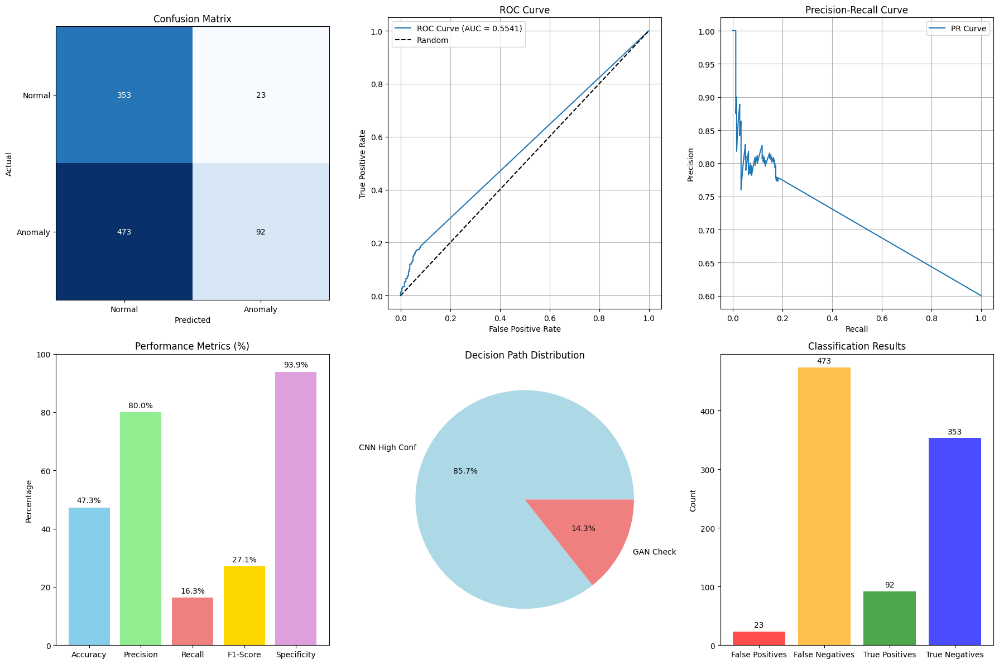


✅ Comprehensive evaluation results saved to gan_anomaly_results4_cnn_0.85.csv

🧪 Testing CNN confidence threshold: 0.9

🔍 EVALUATING HYBRID GAN ANOMALY DETECTOR
CNN confidence threshold: 0.9
GAN anomaly threshold: 0.107734

📊 Processing 376 normal images...
  Progress: 0/376
  Progress: 50/376
  Progress: 100/376
  Progress: 150/376
  Progress: 200/376
  Progress: 250/376
  Progress: 300/376
  Progress: 350/376

📊 Processing 565 anomalous images...
  Progress: 0/565
  Progress: 50/565
  Progress: 100/565
  Progress: 150/565
  Progress: 200/565
  Progress: 250/565
  Progress: 300/565
  Progress: 350/565
  Progress: 400/565
  Progress: 450/565
  Progress: 500/565
  Progress: 550/565

🎯 HYBRID GAN ANOMALY DETECTION EVALUATION RESULTS
📋 Configuration:
   CNN Confidence Threshold: 0.9
   GAN Anomaly Threshold: 0.107734
   Total Images Processed: 941
   Normal Images: 376
   Anomalous Images: 565

🛣️  Decision Path Analysis:
   CNN High Confidence Decisions: 783 (83.2%)
   GAN Anomaly Check

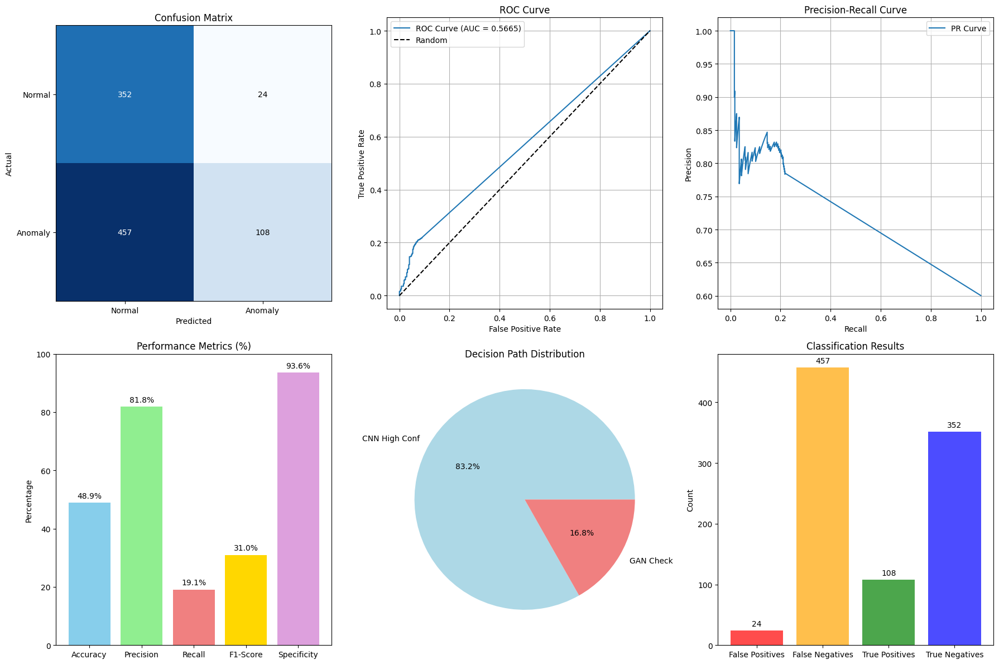


✅ Comprehensive evaluation results saved to gan_anomaly_results4_cnn_0.9.csv

🧪 Testing CNN confidence threshold: 0.95

🔍 EVALUATING HYBRID GAN ANOMALY DETECTOR
CNN confidence threshold: 0.95
GAN anomaly threshold: 0.107734

📊 Processing 376 normal images...
  Progress: 0/376
  Progress: 50/376
  Progress: 100/376
  Progress: 150/376
  Progress: 200/376
  Progress: 250/376
  Progress: 300/376
  Progress: 350/376

📊 Processing 565 anomalous images...
  Progress: 0/565
  Progress: 50/565
  Progress: 100/565
  Progress: 150/565
  Progress: 200/565
  Progress: 250/565
  Progress: 300/565
  Progress: 350/565
  Progress: 400/565
  Progress: 450/565
  Progress: 500/565
  Progress: 550/565

🎯 HYBRID GAN ANOMALY DETECTION EVALUATION RESULTS
📋 Configuration:
   CNN Confidence Threshold: 0.95
   GAN Anomaly Threshold: 0.107734
   Total Images Processed: 941
   Normal Images: 376
   Anomalous Images: 565

🛣️  Decision Path Analysis:
   CNN High Confidence Decisions: 741 (78.7%)
   GAN Anomaly Che

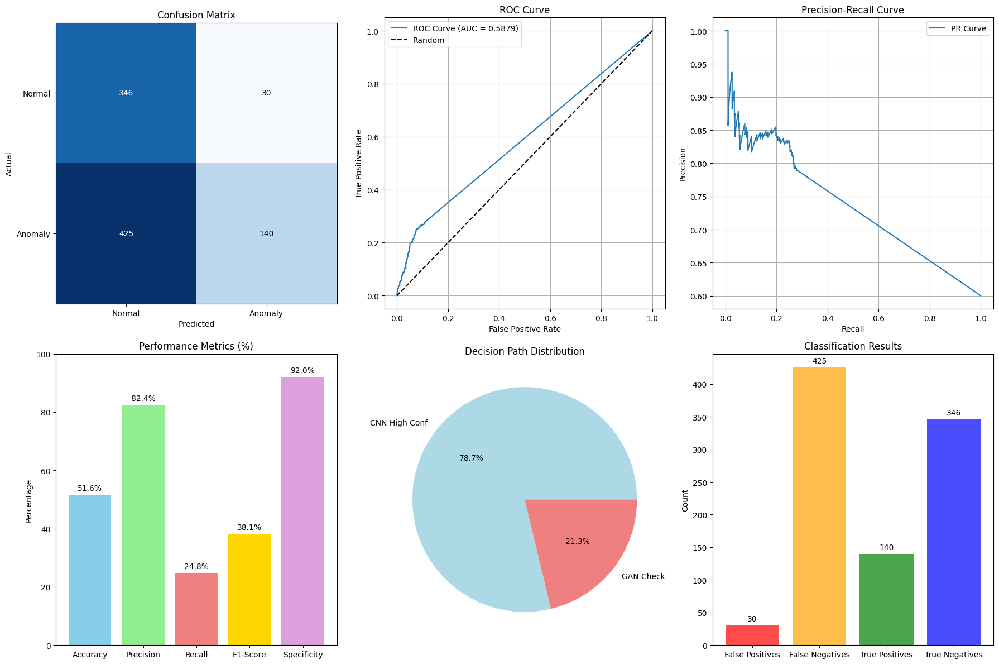


✅ Comprehensive evaluation results saved to gan_anomaly_results4_cnn_0.95.csv

🧪 Testing CNN confidence threshold: 1.0

🔍 EVALUATING HYBRID GAN ANOMALY DETECTOR
CNN confidence threshold: 1.0
GAN anomaly threshold: 0.107734

📊 Processing 376 normal images...
  Progress: 0/376
  Progress: 50/376
  Progress: 100/376
  Progress: 150/376
  Progress: 200/376
  Progress: 250/376
  Progress: 300/376
  Progress: 350/376

📊 Processing 565 anomalous images...
  Progress: 0/565
  Progress: 50/565
  Progress: 100/565
  Progress: 150/565
  Progress: 200/565
  Progress: 250/565
  Progress: 300/565
  Progress: 350/565
  Progress: 400/565
  Progress: 450/565
  Progress: 500/565
  Progress: 550/565

🎯 HYBRID GAN ANOMALY DETECTION EVALUATION RESULTS
📋 Configuration:
   CNN Confidence Threshold: 1.0
   GAN Anomaly Threshold: 0.107734
   Total Images Processed: 941
   Normal Images: 376
   Anomalous Images: 565

🛣️  Decision Path Analysis:
   CNN High Confidence Decisions: 295 (31.3%)
   GAN Anomaly Check

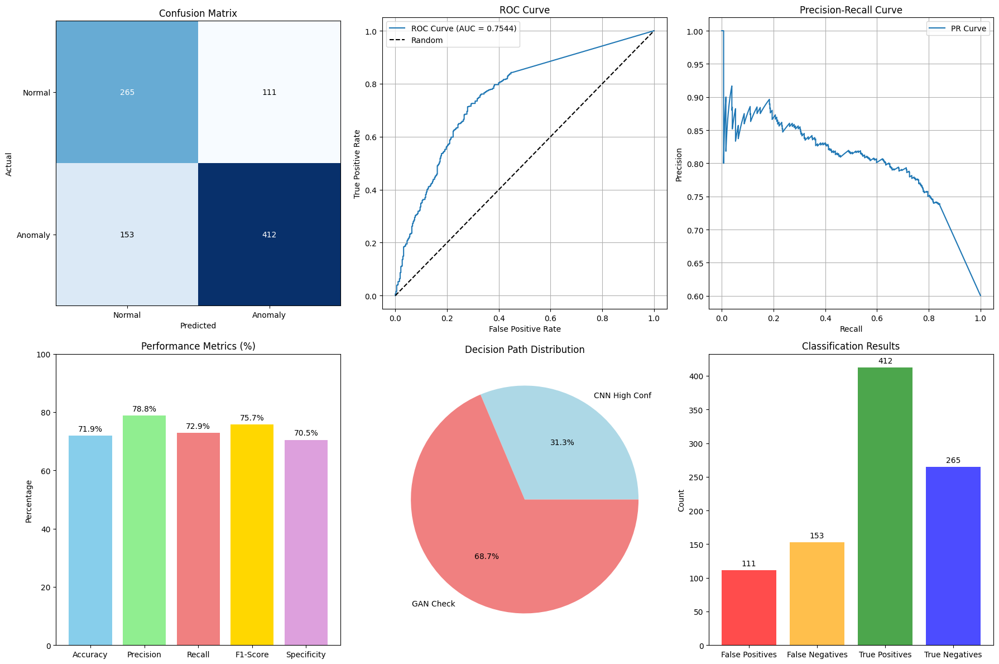


✅ Comprehensive evaluation results saved to gan_anomaly_results4_cnn_1.0.csv

📊 THRESHOLD COMPARISON SUMMARY
CNN Threshold   Accuracy   Precision    Recall     F1-Score   Specificity  ROC AUC   
----------------------------------------------------------------------------------------------------
0.85            47.29    % 80.00      % 16.28    % 27.06    % 93.88      % 0.5541    
0.9             48.88    % 81.82      % 19.12    % 30.99    % 93.62      % 0.5665    
0.95            51.65    % 82.35      % 24.78    % 38.10    % 92.02      % 0.5879    
1.0             71.94    % 78.78      % 72.92    % 75.74    % 70.48      % 0.7544    

✅ Threshold comparison summary saved to gan_threshold_comparison_summary.csv


In [29]:
results_summary = test_multiple_gan_thresholds(
    'testing/normal', 
    'testing/anomaly2'
)